# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

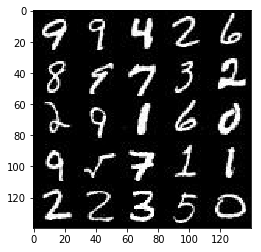

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

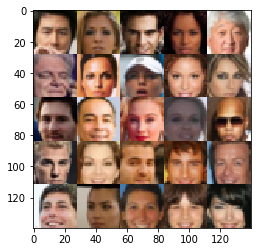

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

/home/goncalossilva/.conda/envs/py3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


TensorFlow Version: 1.7.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name="input_real")
    input_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    lr = tf.placeholder(tf.float32, name="lr")

    return input_real, input_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
from math import ceil

def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):        
        # Input is 28x28xC. 
        
        l = tf.layers.conv2d(
            images, 64, 5, strides=2, padding='same',
            kernel_initializer=tf.contrib.layers.xavier_initializer())
        l = tf.nn.leaky_relu(l, alpha=alpha)
        l = tf.nn.dropout(l, 0.7)
        
        # Now 14x14x64.
        
        l = tf.layers.conv2d(
            l, 128, 5, strides=2, padding='same',
            kernel_initializer=tf.contrib.layers.xavier_initializer())
        l = tf.layers.batch_normalization(l, training=True)
        l = tf.nn.leaky_relu(l, alpha=alpha)
        l = tf.nn.dropout(l, 0.7)
        
        # Now 7x7x128.
        
        l = tf.layers.conv2d(
            l, 256, 5, strides=2, padding='same',
            kernel_initializer=tf.contrib.layers.xavier_initializer())
        l = tf.layers.batch_normalization(l, training=True)
        l = tf.nn.leaky_relu(l, alpha=alpha)
        l = tf.nn.dropout(l, 0.7)
        
        # Now 4x4x256.
        
        l = tf.layers.conv2d(
            l, 512, 5, strides=2, padding='same',
            kernel_initializer=tf.contrib.layers.xavier_initializer())
        l = tf.layers.batch_normalization(l, training=True)
        l = tf.nn.leaky_relu(l, alpha=alpha)
        l = tf.nn.dropout(l, 0.7)
        
        # Now 2x2x512.
        
        l = tf.reshape(l, (-1, 2 * 2 * 512))
        logits = tf.layers.dense(
            l, 1, kernel_initializer=tf.contrib.layers.xavier_initializer())
        output = tf.sigmoid(logits)

    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=(not is_train)):
        # Fully connected layer.
        l = tf.layers.dense(
            z, 4 * 4 * 512, kernel_initializer=tf.contrib.layers.xavier_initializer())
        
        # Convolutional layer.
        l = tf.reshape(l, (-1, 4, 4, 512))
        l = tf.layers.batch_normalization(l, training=is_train)
        l = tf.nn.leaky_relu(l, alpha=alpha)
        l = tf.nn.dropout(l, 0.6)
        
        # Now 2x2x512.
        
        l = tf.layers.conv2d_transpose(
            l, 256, 4, strides=1, padding='valid',
            kernel_initializer=tf.contrib.layers.xavier_initializer())
        l = tf.layers.batch_normalization(l, training=is_train)
        l = tf.nn.leaky_relu(l, alpha=alpha)
        l = tf.nn.dropout(l, 0.6)
        
        # Now 7x7x256.
        
        l = tf.layers.conv2d_transpose(
            l, 128, 5, strides=2, padding='same',
            kernel_initializer=tf.contrib.layers.xavier_initializer())
        l = tf.layers.batch_normalization(l, training=is_train)
        l = tf.nn.leaky_relu(l, alpha=alpha)
        l = tf.nn.dropout(l, 0.6)
        
        # Now 14x14x128.
        
        logits = tf.layers.conv2d_transpose(
            l, out_channel_dim, 5, strides=2, padding='same',
            kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.tanh(logits)
        
        # Now 28x28xout_channel_dim.
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_output = generator(input_z, out_channel_dim)
    d_output_real, d_logits_real = discriminator(input_real)
    d_output_fake, d_logits_fake = discriminator(g_output, reuse=True)
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_logits_fake, labels=tf.ones_like(d_output_fake)*0.9))
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_logits_real, labels=tf.ones_like(d_output_real)*0.9))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_logits_fake, labels=tf.zeros_like(d_output_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode, print_every_steps=10, show_every_steps=100):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """

    # Create input placeholders.
    _, w, h, c = data_shape
    input_real, input_z, lr = model_inputs(w, h, c, z_dim)

    # Create losses and optimizers.
    d_loss, g_loss = model_loss(input_real, input_z, c)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)

    # Setup training.
    step = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # Scale images from [-0.5,0.5] range to [-1,1].
                batch_images = batch_images*2
                
                # Sample random noise for the generator.
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run discriminator optimizer.
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                # Run generator optimizer twice to ensure discriminator's loss doesn't go to 0.
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                # Print progress.
                step += 1
                if step % print_every_steps == 0:
                    d_train_loss = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    g_train_loss = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(d_train_loss),
                          "Generator Loss: {:.4f}".format(g_train_loss))
                
                # Show progress.
                if (step % show_every_steps == 0):
                    show_generator_output(sess, 25, input_z, c, data_image_mode)
                    
        # Show progress at the very end.
        show_generator_output(sess, 25, input_z, c, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.8070... Generator Loss: 0.5709
Epoch 1/2... Discriminator Loss: 1.9768... Generator Loss: 4.7495
Epoch 1/2... Discriminator Loss: 0.9422... Generator Loss: 2.3939
Epoch 1/2... Discriminator Loss: 0.9276... Generator Loss: 1.5074
Epoch 1/2... Discriminator Loss: 0.5646... Generator Loss: 2.3805
Epoch 1/2... Discriminator Loss: 0.5503... Generator Loss: 3.1491
Epoch 1/2... Discriminator Loss: 0.4540... Generator Loss: 8.6000
Epoch 1/2... Discriminator Loss: 0.6703... Generator Loss: 1.9265
Epoch 1/2... Discriminator Loss: 0.8297... Generator Loss: 2.4818
Epoch 1/2... Discriminator Loss: 0.8175... Generator Loss: 1.9603


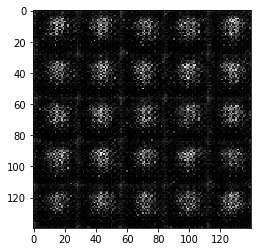

Epoch 1/2... Discriminator Loss: 0.4574... Generator Loss: 4.2638
Epoch 1/2... Discriminator Loss: 0.5468... Generator Loss: 3.1371
Epoch 1/2... Discriminator Loss: 0.4728... Generator Loss: 4.3226
Epoch 1/2... Discriminator Loss: 0.4888... Generator Loss: 4.4991
Epoch 1/2... Discriminator Loss: 0.8117... Generator Loss: 1.8086
Epoch 1/2... Discriminator Loss: 0.4017... Generator Loss: 3.8323
Epoch 1/2... Discriminator Loss: 0.9876... Generator Loss: 1.2070
Epoch 1/2... Discriminator Loss: 0.4838... Generator Loss: 2.5897
Epoch 1/2... Discriminator Loss: 0.7522... Generator Loss: 2.7342
Epoch 1/2... Discriminator Loss: 0.5149... Generator Loss: 2.2022


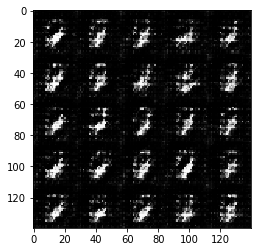

Epoch 1/2... Discriminator Loss: 0.4837... Generator Loss: 2.8857
Epoch 1/2... Discriminator Loss: 1.4833... Generator Loss: 0.7636
Epoch 1/2... Discriminator Loss: 1.2544... Generator Loss: 2.7506
Epoch 1/2... Discriminator Loss: 1.0912... Generator Loss: 1.4208
Epoch 1/2... Discriminator Loss: 0.6632... Generator Loss: 2.0535
Epoch 1/2... Discriminator Loss: 0.6551... Generator Loss: 1.6847
Epoch 1/2... Discriminator Loss: 0.7936... Generator Loss: 1.9053
Epoch 1/2... Discriminator Loss: 0.5001... Generator Loss: 2.9550
Epoch 1/2... Discriminator Loss: 0.5470... Generator Loss: 2.4442
Epoch 1/2... Discriminator Loss: 0.7715... Generator Loss: 1.6225


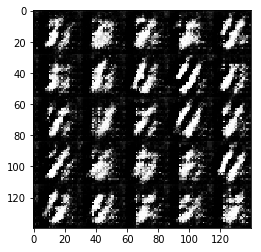

Epoch 1/2... Discriminator Loss: 0.7899... Generator Loss: 1.2132
Epoch 1/2... Discriminator Loss: 0.5243... Generator Loss: 3.0344
Epoch 1/2... Discriminator Loss: 0.9057... Generator Loss: 0.7350
Epoch 1/2... Discriminator Loss: 1.3446... Generator Loss: 0.8825
Epoch 1/2... Discriminator Loss: 0.9343... Generator Loss: 1.0176
Epoch 1/2... Discriminator Loss: 0.6759... Generator Loss: 1.4759
Epoch 1/2... Discriminator Loss: 0.4818... Generator Loss: 2.4643
Epoch 1/2... Discriminator Loss: 0.8552... Generator Loss: 1.0133
Epoch 1/2... Discriminator Loss: 0.5600... Generator Loss: 2.0250
Epoch 1/2... Discriminator Loss: 1.1580... Generator Loss: 3.7884


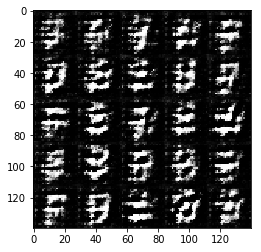

Epoch 1/2... Discriminator Loss: 0.9922... Generator Loss: 4.4508
Epoch 1/2... Discriminator Loss: 0.6539... Generator Loss: 1.7684
Epoch 1/2... Discriminator Loss: 0.7601... Generator Loss: 2.2919
Epoch 1/2... Discriminator Loss: 0.7026... Generator Loss: 2.1317
Epoch 1/2... Discriminator Loss: 0.6773... Generator Loss: 1.9611
Epoch 1/2... Discriminator Loss: 0.6524... Generator Loss: 1.5172
Epoch 1/2... Discriminator Loss: 0.7645... Generator Loss: 3.2701
Epoch 1/2... Discriminator Loss: 0.8788... Generator Loss: 1.3865
Epoch 1/2... Discriminator Loss: 1.1843... Generator Loss: 1.0619
Epoch 1/2... Discriminator Loss: 0.7120... Generator Loss: 0.9409


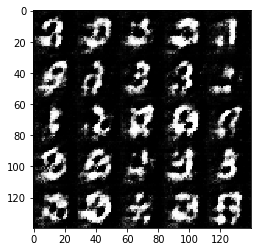

Epoch 1/2... Discriminator Loss: 0.9182... Generator Loss: 1.4938
Epoch 1/2... Discriminator Loss: 0.7991... Generator Loss: 1.7789
Epoch 1/2... Discriminator Loss: 0.8011... Generator Loss: 1.4341
Epoch 1/2... Discriminator Loss: 0.8647... Generator Loss: 1.8532
Epoch 1/2... Discriminator Loss: 1.2946... Generator Loss: 1.1152
Epoch 1/2... Discriminator Loss: 0.8373... Generator Loss: 1.2593
Epoch 1/2... Discriminator Loss: 0.7847... Generator Loss: 1.8342
Epoch 1/2... Discriminator Loss: 1.0710... Generator Loss: 1.0188
Epoch 1/2... Discriminator Loss: 0.8209... Generator Loss: 2.2206
Epoch 1/2... Discriminator Loss: 0.5729... Generator Loss: 3.1748


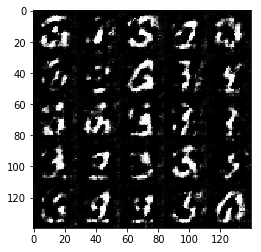

Epoch 1/2... Discriminator Loss: 0.8171... Generator Loss: 3.1044
Epoch 1/2... Discriminator Loss: 1.0710... Generator Loss: 2.3937
Epoch 1/2... Discriminator Loss: 0.8542... Generator Loss: 1.5422
Epoch 1/2... Discriminator Loss: 1.5346... Generator Loss: 3.1206
Epoch 1/2... Discriminator Loss: 1.4243... Generator Loss: 1.1757
Epoch 1/2... Discriminator Loss: 1.3830... Generator Loss: 0.6325
Epoch 1/2... Discriminator Loss: 0.9851... Generator Loss: 1.5052
Epoch 1/2... Discriminator Loss: 0.6625... Generator Loss: 1.7216
Epoch 1/2... Discriminator Loss: 0.9333... Generator Loss: 1.4790
Epoch 1/2... Discriminator Loss: 0.9385... Generator Loss: 1.0787


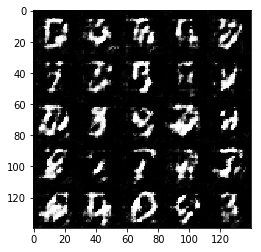

Epoch 1/2... Discriminator Loss: 0.6365... Generator Loss: 2.2027
Epoch 1/2... Discriminator Loss: 0.7476... Generator Loss: 2.8071
Epoch 1/2... Discriminator Loss: 1.1096... Generator Loss: 0.9691
Epoch 1/2... Discriminator Loss: 2.0348... Generator Loss: 3.9494
Epoch 1/2... Discriminator Loss: 0.5882... Generator Loss: 2.1505
Epoch 1/2... Discriminator Loss: 1.6015... Generator Loss: 0.4475
Epoch 1/2... Discriminator Loss: 0.8939... Generator Loss: 1.7366
Epoch 1/2... Discriminator Loss: 0.6523... Generator Loss: 2.6003
Epoch 1/2... Discriminator Loss: 1.3880... Generator Loss: 0.7451
Epoch 1/2... Discriminator Loss: 0.8352... Generator Loss: 1.1281


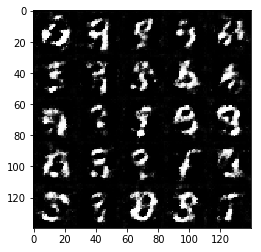

Epoch 1/2... Discriminator Loss: 0.6934... Generator Loss: 2.2675
Epoch 1/2... Discriminator Loss: 1.7860... Generator Loss: 0.7158
Epoch 1/2... Discriminator Loss: 1.1807... Generator Loss: 0.9742
Epoch 1/2... Discriminator Loss: 0.7797... Generator Loss: 1.6762
Epoch 1/2... Discriminator Loss: 0.8736... Generator Loss: 2.0507
Epoch 1/2... Discriminator Loss: 0.6374... Generator Loss: 1.6439
Epoch 1/2... Discriminator Loss: 0.8612... Generator Loss: 1.8516
Epoch 1/2... Discriminator Loss: 1.1869... Generator Loss: 3.3699
Epoch 1/2... Discriminator Loss: 1.3196... Generator Loss: 0.9678
Epoch 1/2... Discriminator Loss: 1.3162... Generator Loss: 1.9023


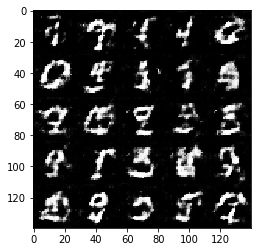

Epoch 1/2... Discriminator Loss: 0.6298... Generator Loss: 2.1200
Epoch 1/2... Discriminator Loss: 1.2306... Generator Loss: 0.6545
Epoch 1/2... Discriminator Loss: 0.8808... Generator Loss: 2.1668
Epoch 1/2... Discriminator Loss: 0.7221... Generator Loss: 2.2652
Epoch 1/2... Discriminator Loss: 0.6743... Generator Loss: 2.1848
Epoch 1/2... Discriminator Loss: 0.8983... Generator Loss: 1.4323
Epoch 1/2... Discriminator Loss: 0.8988... Generator Loss: 3.4082
Epoch 1/2... Discriminator Loss: 0.7659... Generator Loss: 1.7495
Epoch 1/2... Discriminator Loss: 1.3764... Generator Loss: 2.2249
Epoch 1/2... Discriminator Loss: 1.6946... Generator Loss: 0.5036


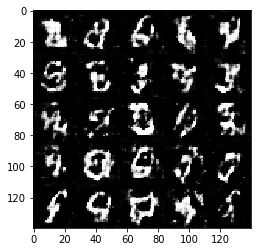

Epoch 1/2... Discriminator Loss: 1.2691... Generator Loss: 0.6009
Epoch 1/2... Discriminator Loss: 0.8540... Generator Loss: 0.6945
Epoch 1/2... Discriminator Loss: 0.9089... Generator Loss: 0.9714
Epoch 1/2... Discriminator Loss: 1.0530... Generator Loss: 1.3541
Epoch 1/2... Discriminator Loss: 0.9518... Generator Loss: 1.2095
Epoch 1/2... Discriminator Loss: 0.7494... Generator Loss: 1.6260
Epoch 1/2... Discriminator Loss: 0.6869... Generator Loss: 2.5419
Epoch 1/2... Discriminator Loss: 1.2575... Generator Loss: 3.0799
Epoch 1/2... Discriminator Loss: 0.6890... Generator Loss: 3.3861
Epoch 1/2... Discriminator Loss: 1.1302... Generator Loss: 1.3898


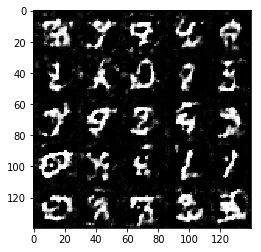

Epoch 1/2... Discriminator Loss: 0.7044... Generator Loss: 1.9076
Epoch 1/2... Discriminator Loss: 0.9690... Generator Loss: 1.1780
Epoch 1/2... Discriminator Loss: 1.1708... Generator Loss: 3.3397
Epoch 1/2... Discriminator Loss: 0.6561... Generator Loss: 2.7941
Epoch 1/2... Discriminator Loss: 1.2995... Generator Loss: 2.5294
Epoch 1/2... Discriminator Loss: 0.8539... Generator Loss: 2.8861
Epoch 1/2... Discriminator Loss: 0.5523... Generator Loss: 1.9073
Epoch 1/2... Discriminator Loss: 1.1271... Generator Loss: 0.9460
Epoch 1/2... Discriminator Loss: 0.7913... Generator Loss: 0.9497
Epoch 1/2... Discriminator Loss: 0.7126... Generator Loss: 2.0845


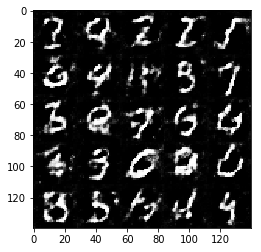

Epoch 1/2... Discriminator Loss: 0.5938... Generator Loss: 2.7622
Epoch 1/2... Discriminator Loss: 1.0568... Generator Loss: 0.8124
Epoch 1/2... Discriminator Loss: 0.6471... Generator Loss: 1.7386
Epoch 1/2... Discriminator Loss: 0.7466... Generator Loss: 2.0192
Epoch 1/2... Discriminator Loss: 0.7059... Generator Loss: 2.4069
Epoch 1/2... Discriminator Loss: 0.5764... Generator Loss: 1.9509
Epoch 1/2... Discriminator Loss: 0.6425... Generator Loss: 2.0182
Epoch 1/2... Discriminator Loss: 1.1070... Generator Loss: 0.7442
Epoch 1/2... Discriminator Loss: 1.3898... Generator Loss: 0.5485
Epoch 1/2... Discriminator Loss: 0.9372... Generator Loss: 2.0508


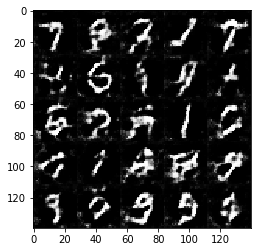

Epoch 1/2... Discriminator Loss: 1.2093... Generator Loss: 0.8551
Epoch 1/2... Discriminator Loss: 0.7311... Generator Loss: 3.2157
Epoch 1/2... Discriminator Loss: 0.7631... Generator Loss: 1.0074
Epoch 1/2... Discriminator Loss: 0.7104... Generator Loss: 1.2592
Epoch 1/2... Discriminator Loss: 0.9649... Generator Loss: 0.7539
Epoch 1/2... Discriminator Loss: 0.7012... Generator Loss: 2.4028
Epoch 1/2... Discriminator Loss: 1.0247... Generator Loss: 1.5510
Epoch 1/2... Discriminator Loss: 0.6122... Generator Loss: 3.9208
Epoch 1/2... Discriminator Loss: 0.5722... Generator Loss: 1.3013
Epoch 1/2... Discriminator Loss: 0.5949... Generator Loss: 1.4933


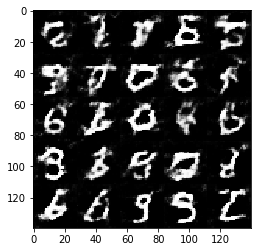

Epoch 1/2... Discriminator Loss: 1.0566... Generator Loss: 0.8616
Epoch 1/2... Discriminator Loss: 0.6814... Generator Loss: 2.5438
Epoch 1/2... Discriminator Loss: 0.6183... Generator Loss: 2.3516
Epoch 1/2... Discriminator Loss: 0.4898... Generator Loss: 1.7227
Epoch 1/2... Discriminator Loss: 1.3955... Generator Loss: 2.7307
Epoch 1/2... Discriminator Loss: 0.7310... Generator Loss: 2.0252
Epoch 1/2... Discriminator Loss: 0.6791... Generator Loss: 1.9572
Epoch 1/2... Discriminator Loss: 0.8387... Generator Loss: 1.2382
Epoch 1/2... Discriminator Loss: 0.5585... Generator Loss: 2.0627
Epoch 1/2... Discriminator Loss: 1.3324... Generator Loss: 0.7177


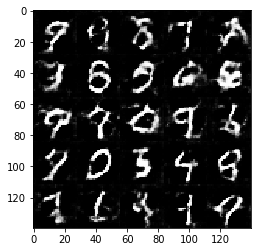

Epoch 1/2... Discriminator Loss: 1.1862... Generator Loss: 0.6814
Epoch 1/2... Discriminator Loss: 0.5397... Generator Loss: 1.8558
Epoch 1/2... Discriminator Loss: 0.6969... Generator Loss: 1.9204
Epoch 1/2... Discriminator Loss: 0.7098... Generator Loss: 1.5930
Epoch 1/2... Discriminator Loss: 0.6382... Generator Loss: 1.1216
Epoch 1/2... Discriminator Loss: 0.6225... Generator Loss: 2.8122
Epoch 1/2... Discriminator Loss: 0.6173... Generator Loss: 1.7380
Epoch 1/2... Discriminator Loss: 0.5584... Generator Loss: 2.5941
Epoch 1/2... Discriminator Loss: 0.6830... Generator Loss: 1.3702
Epoch 1/2... Discriminator Loss: 0.7669... Generator Loss: 1.7276


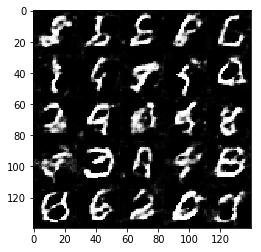

Epoch 1/2... Discriminator Loss: 0.6096... Generator Loss: 2.1691
Epoch 1/2... Discriminator Loss: 0.7289... Generator Loss: 3.1756
Epoch 1/2... Discriminator Loss: 0.6811... Generator Loss: 3.0238
Epoch 1/2... Discriminator Loss: 0.6753... Generator Loss: 1.7177
Epoch 1/2... Discriminator Loss: 1.3277... Generator Loss: 0.6896
Epoch 1/2... Discriminator Loss: 0.8859... Generator Loss: 1.0978
Epoch 1/2... Discriminator Loss: 0.5147... Generator Loss: 1.9989
Epoch 1/2... Discriminator Loss: 0.7950... Generator Loss: 2.9877
Epoch 1/2... Discriminator Loss: 0.6055... Generator Loss: 2.3237
Epoch 1/2... Discriminator Loss: 0.8938... Generator Loss: 1.5975


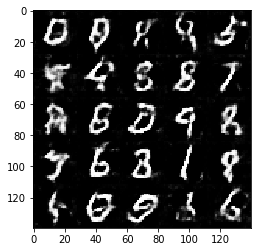

Epoch 1/2... Discriminator Loss: 0.6777... Generator Loss: 1.2498
Epoch 1/2... Discriminator Loss: 0.6993... Generator Loss: 3.4862
Epoch 1/2... Discriminator Loss: 0.7236... Generator Loss: 2.1213
Epoch 1/2... Discriminator Loss: 1.3187... Generator Loss: 0.7800
Epoch 1/2... Discriminator Loss: 0.6654... Generator Loss: 1.8527
Epoch 1/2... Discriminator Loss: 0.9005... Generator Loss: 0.9698
Epoch 1/2... Discriminator Loss: 0.8072... Generator Loss: 2.5035
Epoch 1/2... Discriminator Loss: 0.6577... Generator Loss: 3.8132
Epoch 1/2... Discriminator Loss: 0.7613... Generator Loss: 2.7283
Epoch 1/2... Discriminator Loss: 1.3265... Generator Loss: 2.2994


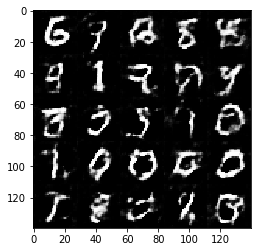

Epoch 1/2... Discriminator Loss: 0.7446... Generator Loss: 2.3056
Epoch 1/2... Discriminator Loss: 0.8807... Generator Loss: 1.3490
Epoch 1/2... Discriminator Loss: 1.1483... Generator Loss: 0.6573
Epoch 1/2... Discriminator Loss: 0.5812... Generator Loss: 1.0996
Epoch 1/2... Discriminator Loss: 1.0278... Generator Loss: 0.6683
Epoch 1/2... Discriminator Loss: 0.7250... Generator Loss: 2.0380
Epoch 1/2... Discriminator Loss: 0.7215... Generator Loss: 1.0485
Epoch 2/2... Discriminator Loss: 0.6685... Generator Loss: 2.4280
Epoch 2/2... Discriminator Loss: 0.7588... Generator Loss: 1.6805
Epoch 2/2... Discriminator Loss: 1.3164... Generator Loss: 0.7788


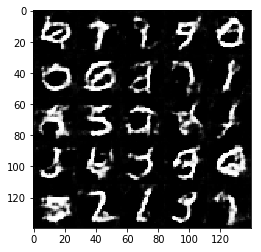

Epoch 2/2... Discriminator Loss: 0.8453... Generator Loss: 1.0180
Epoch 2/2... Discriminator Loss: 1.2053... Generator Loss: 1.3263
Epoch 2/2... Discriminator Loss: 0.9414... Generator Loss: 1.6001
Epoch 2/2... Discriminator Loss: 0.4836... Generator Loss: 2.0816
Epoch 2/2... Discriminator Loss: 0.5881... Generator Loss: 1.2330
Epoch 2/2... Discriminator Loss: 0.9968... Generator Loss: 0.6334
Epoch 2/2... Discriminator Loss: 0.6736... Generator Loss: 1.4049
Epoch 2/2... Discriminator Loss: 0.9942... Generator Loss: 3.2623
Epoch 2/2... Discriminator Loss: 1.2797... Generator Loss: 0.9764
Epoch 2/2... Discriminator Loss: 0.6899... Generator Loss: 1.5315


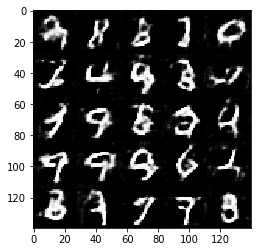

Epoch 2/2... Discriminator Loss: 0.7005... Generator Loss: 2.3529
Epoch 2/2... Discriminator Loss: 0.6349... Generator Loss: 2.4616
Epoch 2/2... Discriminator Loss: 0.5396... Generator Loss: 1.5698
Epoch 2/2... Discriminator Loss: 0.7432... Generator Loss: 1.7485
Epoch 2/2... Discriminator Loss: 0.8635... Generator Loss: 0.8899
Epoch 2/2... Discriminator Loss: 0.5977... Generator Loss: 2.0305
Epoch 2/2... Discriminator Loss: 0.8247... Generator Loss: 3.6634
Epoch 2/2... Discriminator Loss: 0.5829... Generator Loss: 1.9202
Epoch 2/2... Discriminator Loss: 0.4163... Generator Loss: 3.1649
Epoch 2/2... Discriminator Loss: 0.6212... Generator Loss: 1.7751


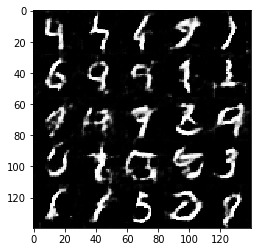

Epoch 2/2... Discriminator Loss: 0.6888... Generator Loss: 1.2236
Epoch 2/2... Discriminator Loss: 1.2905... Generator Loss: 0.6094
Epoch 2/2... Discriminator Loss: 0.6107... Generator Loss: 2.3371
Epoch 2/2... Discriminator Loss: 0.5789... Generator Loss: 1.5907
Epoch 2/2... Discriminator Loss: 1.0251... Generator Loss: 2.1609
Epoch 2/2... Discriminator Loss: 0.6361... Generator Loss: 1.5271
Epoch 2/2... Discriminator Loss: 0.6560... Generator Loss: 1.6595
Epoch 2/2... Discriminator Loss: 0.4694... Generator Loss: 2.4113
Epoch 2/2... Discriminator Loss: 0.8301... Generator Loss: 1.2185
Epoch 2/2... Discriminator Loss: 0.5558... Generator Loss: 2.1029


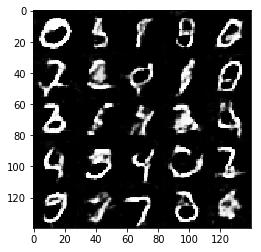

Epoch 2/2... Discriminator Loss: 0.4853... Generator Loss: 2.5909
Epoch 2/2... Discriminator Loss: 0.7683... Generator Loss: 3.3929
Epoch 2/2... Discriminator Loss: 0.4154... Generator Loss: 2.3404
Epoch 2/2... Discriminator Loss: 0.7115... Generator Loss: 3.1214
Epoch 2/2... Discriminator Loss: 0.4545... Generator Loss: 2.0967
Epoch 2/2... Discriminator Loss: 0.7170... Generator Loss: 1.8559
Epoch 2/2... Discriminator Loss: 0.9118... Generator Loss: 1.4915
Epoch 2/2... Discriminator Loss: 0.7374... Generator Loss: 3.0667
Epoch 2/2... Discriminator Loss: 0.8107... Generator Loss: 1.0451
Epoch 2/2... Discriminator Loss: 0.6655... Generator Loss: 1.7941


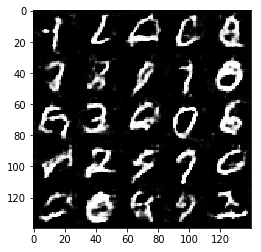

Epoch 2/2... Discriminator Loss: 0.7378... Generator Loss: 1.3558
Epoch 2/2... Discriminator Loss: 0.5259... Generator Loss: 2.0527
Epoch 2/2... Discriminator Loss: 1.0570... Generator Loss: 0.8404
Epoch 2/2... Discriminator Loss: 0.8228... Generator Loss: 1.0978
Epoch 2/2... Discriminator Loss: 0.7292... Generator Loss: 1.9391
Epoch 2/2... Discriminator Loss: 0.6491... Generator Loss: 1.6622
Epoch 2/2... Discriminator Loss: 0.7611... Generator Loss: 0.8108
Epoch 2/2... Discriminator Loss: 0.6461... Generator Loss: 3.4816
Epoch 2/2... Discriminator Loss: 0.6497... Generator Loss: 1.0424
Epoch 2/2... Discriminator Loss: 0.7657... Generator Loss: 3.2182


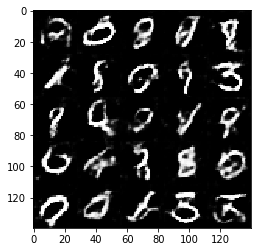

Epoch 2/2... Discriminator Loss: 0.5276... Generator Loss: 3.3493
Epoch 2/2... Discriminator Loss: 0.6041... Generator Loss: 2.0297
Epoch 2/2... Discriminator Loss: 0.7645... Generator Loss: 1.5831
Epoch 2/2... Discriminator Loss: 0.5516... Generator Loss: 2.3638
Epoch 2/2... Discriminator Loss: 0.6497... Generator Loss: 2.1034
Epoch 2/2... Discriminator Loss: 0.8312... Generator Loss: 0.6782
Epoch 2/2... Discriminator Loss: 0.4355... Generator Loss: 2.8519
Epoch 2/2... Discriminator Loss: 1.3023... Generator Loss: 0.8672
Epoch 2/2... Discriminator Loss: 0.5499... Generator Loss: 1.5432
Epoch 2/2... Discriminator Loss: 1.8415... Generator Loss: 0.4846


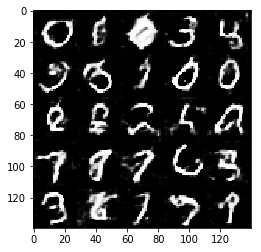

Epoch 2/2... Discriminator Loss: 0.6877... Generator Loss: 2.8237
Epoch 2/2... Discriminator Loss: 0.4334... Generator Loss: 2.8836
Epoch 2/2... Discriminator Loss: 1.0319... Generator Loss: 1.1127
Epoch 2/2... Discriminator Loss: 0.5739... Generator Loss: 2.2666
Epoch 2/2... Discriminator Loss: 0.6399... Generator Loss: 3.1174
Epoch 2/2... Discriminator Loss: 1.2055... Generator Loss: 2.7092
Epoch 2/2... Discriminator Loss: 0.5941... Generator Loss: 2.5726
Epoch 2/2... Discriminator Loss: 0.6954... Generator Loss: 1.7336
Epoch 2/2... Discriminator Loss: 0.6449... Generator Loss: 1.3493
Epoch 2/2... Discriminator Loss: 0.6641... Generator Loss: 2.7979


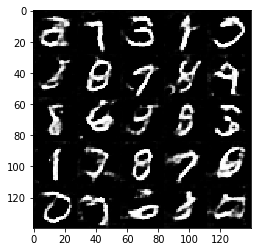

Epoch 2/2... Discriminator Loss: 0.9124... Generator Loss: 1.7711
Epoch 2/2... Discriminator Loss: 1.0090... Generator Loss: 1.2357
Epoch 2/2... Discriminator Loss: 0.5275... Generator Loss: 2.4793
Epoch 2/2... Discriminator Loss: 0.5815... Generator Loss: 2.4843
Epoch 2/2... Discriminator Loss: 1.1367... Generator Loss: 1.1394
Epoch 2/2... Discriminator Loss: 0.5405... Generator Loss: 2.1369
Epoch 2/2... Discriminator Loss: 0.7408... Generator Loss: 4.9164
Epoch 2/2... Discriminator Loss: 0.6405... Generator Loss: 3.7320
Epoch 2/2... Discriminator Loss: 0.4732... Generator Loss: 3.4223
Epoch 2/2... Discriminator Loss: 0.5432... Generator Loss: 2.2748


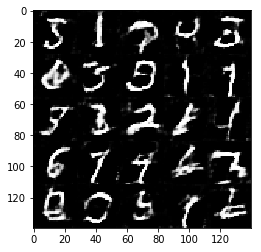

Epoch 2/2... Discriminator Loss: 0.5006... Generator Loss: 3.9957
Epoch 2/2... Discriminator Loss: 0.5993... Generator Loss: 1.5096
Epoch 2/2... Discriminator Loss: 0.5557... Generator Loss: 2.3097
Epoch 2/2... Discriminator Loss: 0.5691... Generator Loss: 2.6320
Epoch 2/2... Discriminator Loss: 0.7227... Generator Loss: 1.4627
Epoch 2/2... Discriminator Loss: 0.4733... Generator Loss: 1.6208
Epoch 2/2... Discriminator Loss: 0.5009... Generator Loss: 1.9479
Epoch 2/2... Discriminator Loss: 0.9649... Generator Loss: 2.2537
Epoch 2/2... Discriminator Loss: 0.5500... Generator Loss: 1.3202
Epoch 2/2... Discriminator Loss: 0.5467... Generator Loss: 2.8491


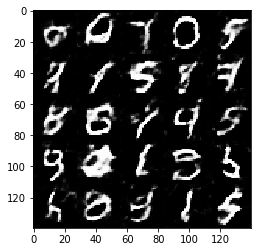

Epoch 2/2... Discriminator Loss: 0.5628... Generator Loss: 1.6085
Epoch 2/2... Discriminator Loss: 0.5909... Generator Loss: 1.7160
Epoch 2/2... Discriminator Loss: 0.4873... Generator Loss: 2.3985
Epoch 2/2... Discriminator Loss: 0.6269... Generator Loss: 2.5925
Epoch 2/2... Discriminator Loss: 0.5215... Generator Loss: 1.1725
Epoch 2/2... Discriminator Loss: 0.6123... Generator Loss: 1.5975
Epoch 2/2... Discriminator Loss: 0.4412... Generator Loss: 2.1628
Epoch 2/2... Discriminator Loss: 0.4523... Generator Loss: 2.2760
Epoch 2/2... Discriminator Loss: 0.6300... Generator Loss: 3.0331
Epoch 2/2... Discriminator Loss: 0.6935... Generator Loss: 1.2744


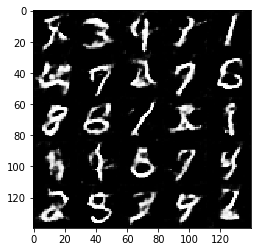

Epoch 2/2... Discriminator Loss: 0.5750... Generator Loss: 2.6888
Epoch 2/2... Discriminator Loss: 0.6389... Generator Loss: 2.0513
Epoch 2/2... Discriminator Loss: 0.4620... Generator Loss: 2.4458
Epoch 2/2... Discriminator Loss: 0.5377... Generator Loss: 2.4767
Epoch 2/2... Discriminator Loss: 0.5784... Generator Loss: 4.4694
Epoch 2/2... Discriminator Loss: 0.4679... Generator Loss: 2.6519
Epoch 2/2... Discriminator Loss: 0.6301... Generator Loss: 2.3039
Epoch 2/2... Discriminator Loss: 0.4809... Generator Loss: 4.0486
Epoch 2/2... Discriminator Loss: 0.7704... Generator Loss: 0.9972
Epoch 2/2... Discriminator Loss: 0.4692... Generator Loss: 2.1482


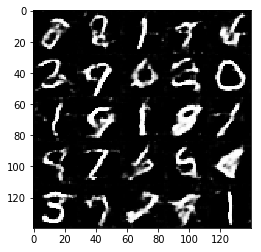

Epoch 2/2... Discriminator Loss: 0.5469... Generator Loss: 2.1624
Epoch 2/2... Discriminator Loss: 0.5298... Generator Loss: 4.1731
Epoch 2/2... Discriminator Loss: 0.6131... Generator Loss: 2.9969
Epoch 2/2... Discriminator Loss: 0.6165... Generator Loss: 1.5228
Epoch 2/2... Discriminator Loss: 0.4010... Generator Loss: 3.0177
Epoch 2/2... Discriminator Loss: 0.5962... Generator Loss: 1.7242
Epoch 2/2... Discriminator Loss: 0.4478... Generator Loss: 2.2321
Epoch 2/2... Discriminator Loss: 0.6912... Generator Loss: 1.4950
Epoch 2/2... Discriminator Loss: 0.4514... Generator Loss: 3.5130
Epoch 2/2... Discriminator Loss: 0.5578... Generator Loss: 1.3150


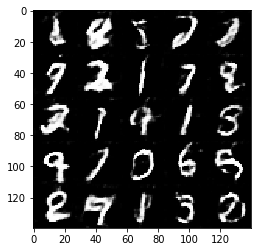

Epoch 2/2... Discriminator Loss: 0.4405... Generator Loss: 3.2518
Epoch 2/2... Discriminator Loss: 0.5177... Generator Loss: 2.0557
Epoch 2/2... Discriminator Loss: 0.5161... Generator Loss: 2.3720
Epoch 2/2... Discriminator Loss: 0.4856... Generator Loss: 2.2233
Epoch 2/2... Discriminator Loss: 0.7259... Generator Loss: 1.2372
Epoch 2/2... Discriminator Loss: 0.6069... Generator Loss: 1.5284
Epoch 2/2... Discriminator Loss: 0.5904... Generator Loss: 1.5189
Epoch 2/2... Discriminator Loss: 0.6506... Generator Loss: 2.7891
Epoch 2/2... Discriminator Loss: 0.4797... Generator Loss: 3.1792
Epoch 2/2... Discriminator Loss: 0.4060... Generator Loss: 3.3865


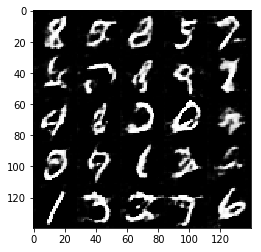

Epoch 2/2... Discriminator Loss: 0.6646... Generator Loss: 1.6223
Epoch 2/2... Discriminator Loss: 0.3885... Generator Loss: 3.4873
Epoch 2/2... Discriminator Loss: 0.4320... Generator Loss: 2.9679
Epoch 2/2... Discriminator Loss: 0.4386... Generator Loss: 3.1971
Epoch 2/2... Discriminator Loss: 0.3838... Generator Loss: 3.1293
Epoch 2/2... Discriminator Loss: 0.6090... Generator Loss: 1.1715
Epoch 2/2... Discriminator Loss: 0.4725... Generator Loss: 2.2448
Epoch 2/2... Discriminator Loss: 0.5779... Generator Loss: 1.6017
Epoch 2/2... Discriminator Loss: 0.4545... Generator Loss: 3.0290
Epoch 2/2... Discriminator Loss: 0.4240... Generator Loss: 1.6489


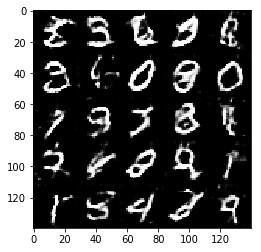

Epoch 2/2... Discriminator Loss: 0.7117... Generator Loss: 1.2549
Epoch 2/2... Discriminator Loss: 0.5288... Generator Loss: 2.9583
Epoch 2/2... Discriminator Loss: 0.5176... Generator Loss: 2.4928
Epoch 2/2... Discriminator Loss: 0.6319... Generator Loss: 1.6544
Epoch 2/2... Discriminator Loss: 0.4386... Generator Loss: 3.1930
Epoch 2/2... Discriminator Loss: 0.5323... Generator Loss: 1.1768
Epoch 2/2... Discriminator Loss: 0.8070... Generator Loss: 3.1379
Epoch 2/2... Discriminator Loss: 0.5312... Generator Loss: 1.4995
Epoch 2/2... Discriminator Loss: 0.7936... Generator Loss: 3.1808
Epoch 2/2... Discriminator Loss: 0.6372... Generator Loss: 2.1219


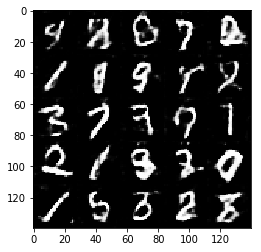

Epoch 2/2... Discriminator Loss: 0.6287... Generator Loss: 1.7794
Epoch 2/2... Discriminator Loss: 0.4304... Generator Loss: 2.9212
Epoch 2/2... Discriminator Loss: 0.5864... Generator Loss: 2.8483
Epoch 2/2... Discriminator Loss: 0.5782... Generator Loss: 2.0245
Epoch 2/2... Discriminator Loss: 0.8210... Generator Loss: 3.0050
Epoch 2/2... Discriminator Loss: 0.6046... Generator Loss: 3.1999
Epoch 2/2... Discriminator Loss: 0.5047... Generator Loss: 2.3766
Epoch 2/2... Discriminator Loss: 0.4818... Generator Loss: 1.3404
Epoch 2/2... Discriminator Loss: 0.6153... Generator Loss: 1.1803
Epoch 2/2... Discriminator Loss: 0.4323... Generator Loss: 2.6518


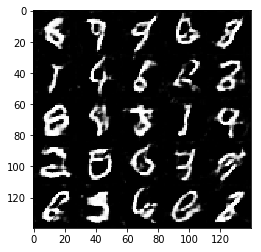

Epoch 2/2... Discriminator Loss: 0.9517... Generator Loss: 3.3491
Epoch 2/2... Discriminator Loss: 0.5740... Generator Loss: 2.0576
Epoch 2/2... Discriminator Loss: 0.6024... Generator Loss: 2.1535
Epoch 2/2... Discriminator Loss: 0.4601... Generator Loss: 3.2385
Epoch 2/2... Discriminator Loss: 0.5255... Generator Loss: 1.9084
Epoch 2/2... Discriminator Loss: 0.6010... Generator Loss: 2.2174
Epoch 2/2... Discriminator Loss: 0.4983... Generator Loss: 2.0826
Epoch 2/2... Discriminator Loss: 0.5336... Generator Loss: 1.3310
Epoch 2/2... Discriminator Loss: 0.4771... Generator Loss: 3.0315
Epoch 2/2... Discriminator Loss: 0.4192... Generator Loss: 2.3377


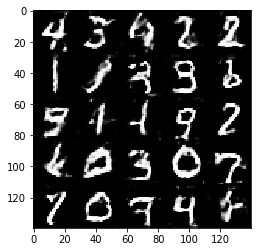

Epoch 2/2... Discriminator Loss: 0.5509... Generator Loss: 3.6725
Epoch 2/2... Discriminator Loss: 0.6399... Generator Loss: 4.5918
Epoch 2/2... Discriminator Loss: 0.4352... Generator Loss: 3.4896
Epoch 2/2... Discriminator Loss: 0.4306... Generator Loss: 1.9520
Epoch 2/2... Discriminator Loss: 0.5471... Generator Loss: 1.7516
Epoch 2/2... Discriminator Loss: 0.6444... Generator Loss: 1.7301
Epoch 2/2... Discriminator Loss: 0.3986... Generator Loss: 3.2921
Epoch 2/2... Discriminator Loss: 0.5251... Generator Loss: 1.7650
Epoch 2/2... Discriminator Loss: 0.5646... Generator Loss: 2.8332
Epoch 2/2... Discriminator Loss: 0.4130... Generator Loss: 2.9933


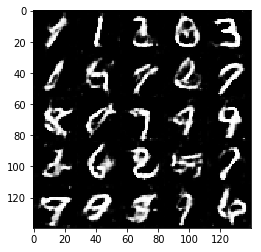

Epoch 2/2... Discriminator Loss: 0.5834... Generator Loss: 2.0785
Epoch 2/2... Discriminator Loss: 0.4532... Generator Loss: 2.7204
Epoch 2/2... Discriminator Loss: 0.5317... Generator Loss: 2.3138
Epoch 2/2... Discriminator Loss: 0.4878... Generator Loss: 2.6696
Epoch 2/2... Discriminator Loss: 0.4531... Generator Loss: 3.5509


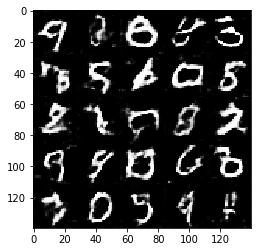

In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.9015... Generator Loss: 1.9375
Epoch 1/1... Discriminator Loss: 0.9014... Generator Loss: 1.6182
Epoch 1/1... Discriminator Loss: 0.7797... Generator Loss: 5.3871
Epoch 1/1... Discriminator Loss: 0.7948... Generator Loss: 3.7822
Epoch 1/1... Discriminator Loss: 0.7290... Generator Loss: 5.4998
Epoch 1/1... Discriminator Loss: 0.5797... Generator Loss: 3.0427
Epoch 1/1... Discriminator Loss: 0.4896... Generator Loss: 3.7729
Epoch 1/1... Discriminator Loss: 1.4844... Generator Loss: 6.6251
Epoch 1/1... Discriminator Loss: 0.8733... Generator Loss: 1.5836
Epoch 1/1... Discriminator Loss: 1.3704... Generator Loss: 0.7058


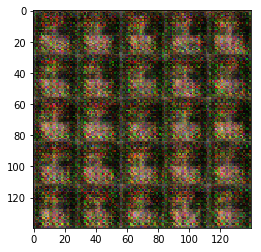

Epoch 1/1... Discriminator Loss: 0.5338... Generator Loss: 2.9724
Epoch 1/1... Discriminator Loss: 0.4926... Generator Loss: 2.3947
Epoch 1/1... Discriminator Loss: 0.5188... Generator Loss: 2.4622
Epoch 1/1... Discriminator Loss: 0.4409... Generator Loss: 3.2108
Epoch 1/1... Discriminator Loss: 0.5105... Generator Loss: 3.0828
Epoch 1/1... Discriminator Loss: 0.5262... Generator Loss: 2.9367
Epoch 1/1... Discriminator Loss: 0.5669... Generator Loss: 1.7064
Epoch 1/1... Discriminator Loss: 0.6222... Generator Loss: 2.4863
Epoch 1/1... Discriminator Loss: 0.8127... Generator Loss: 2.9039
Epoch 1/1... Discriminator Loss: 0.6539... Generator Loss: 2.0223


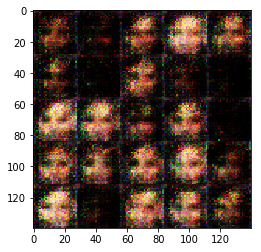

Epoch 1/1... Discriminator Loss: 0.6425... Generator Loss: 2.6597
Epoch 1/1... Discriminator Loss: 0.4329... Generator Loss: 3.3278
Epoch 1/1... Discriminator Loss: 0.5928... Generator Loss: 2.8466
Epoch 1/1... Discriminator Loss: 0.8814... Generator Loss: 3.7507
Epoch 1/1... Discriminator Loss: 0.9905... Generator Loss: 1.5279
Epoch 1/1... Discriminator Loss: 0.8619... Generator Loss: 1.2535
Epoch 1/1... Discriminator Loss: 0.5083... Generator Loss: 4.1015
Epoch 1/1... Discriminator Loss: 0.4979... Generator Loss: 3.7311
Epoch 1/1... Discriminator Loss: 0.6157... Generator Loss: 3.2740
Epoch 1/1... Discriminator Loss: 0.6981... Generator Loss: 2.1443


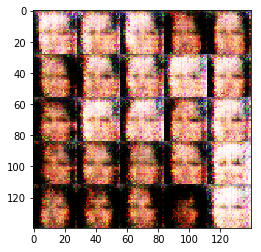

Epoch 1/1... Discriminator Loss: 0.5000... Generator Loss: 3.4460
Epoch 1/1... Discriminator Loss: 0.3649... Generator Loss: 5.0510
Epoch 1/1... Discriminator Loss: 0.5243... Generator Loss: 3.9375
Epoch 1/1... Discriminator Loss: 0.5314... Generator Loss: 2.1933
Epoch 1/1... Discriminator Loss: 0.5550... Generator Loss: 2.5555
Epoch 1/1... Discriminator Loss: 0.4236... Generator Loss: 2.8108
Epoch 1/1... Discriminator Loss: 0.6992... Generator Loss: 2.1354
Epoch 1/1... Discriminator Loss: 0.4850... Generator Loss: 3.6988
Epoch 1/1... Discriminator Loss: 0.5002... Generator Loss: 2.1695
Epoch 1/1... Discriminator Loss: 0.4090... Generator Loss: 3.3605


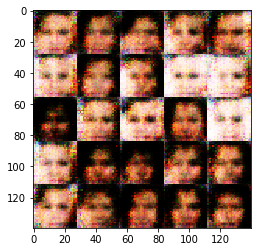

Epoch 1/1... Discriminator Loss: 0.4639... Generator Loss: 2.3500
Epoch 1/1... Discriminator Loss: 0.3862... Generator Loss: 4.8237
Epoch 1/1... Discriminator Loss: 0.4768... Generator Loss: 2.7417
Epoch 1/1... Discriminator Loss: 0.3989... Generator Loss: 3.6837
Epoch 1/1... Discriminator Loss: 0.6015... Generator Loss: 2.2148
Epoch 1/1... Discriminator Loss: 0.5273... Generator Loss: 3.5162
Epoch 1/1... Discriminator Loss: 0.3648... Generator Loss: 4.4487
Epoch 1/1... Discriminator Loss: 0.6979... Generator Loss: 1.8002
Epoch 1/1... Discriminator Loss: 0.5488... Generator Loss: 2.3255
Epoch 1/1... Discriminator Loss: 0.4486... Generator Loss: 2.3050


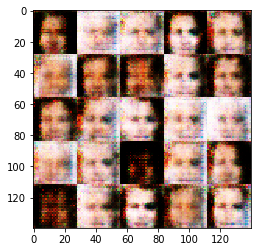

Epoch 1/1... Discriminator Loss: 0.3842... Generator Loss: 3.1667
Epoch 1/1... Discriminator Loss: 0.4342... Generator Loss: 2.3870
Epoch 1/1... Discriminator Loss: 0.3617... Generator Loss: 5.3598
Epoch 1/1... Discriminator Loss: 0.5428... Generator Loss: 1.9256
Epoch 1/1... Discriminator Loss: 0.4253... Generator Loss: 2.8400
Epoch 1/1... Discriminator Loss: 0.7041... Generator Loss: 2.9921
Epoch 1/1... Discriminator Loss: 0.4745... Generator Loss: 1.5526
Epoch 1/1... Discriminator Loss: 0.4555... Generator Loss: 2.2521
Epoch 1/1... Discriminator Loss: 0.4419... Generator Loss: 2.7673
Epoch 1/1... Discriminator Loss: 1.0893... Generator Loss: 1.3073


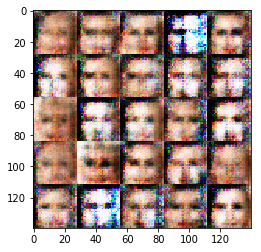

Epoch 1/1... Discriminator Loss: 0.4939... Generator Loss: 2.3328
Epoch 1/1... Discriminator Loss: 0.5823... Generator Loss: 1.9163
Epoch 1/1... Discriminator Loss: 0.8494... Generator Loss: 1.6942
Epoch 1/1... Discriminator Loss: 0.9560... Generator Loss: 1.6488
Epoch 1/1... Discriminator Loss: 0.4504... Generator Loss: 3.8105
Epoch 1/1... Discriminator Loss: 0.4635... Generator Loss: 2.4453
Epoch 1/1... Discriminator Loss: 0.9390... Generator Loss: 1.8716
Epoch 1/1... Discriminator Loss: 0.4774... Generator Loss: 3.2127
Epoch 1/1... Discriminator Loss: 0.7688... Generator Loss: 1.6538
Epoch 1/1... Discriminator Loss: 0.6759... Generator Loss: 3.1799


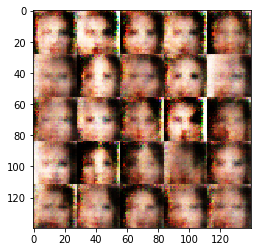

Epoch 1/1... Discriminator Loss: 0.3671... Generator Loss: 4.2226
Epoch 1/1... Discriminator Loss: 0.8157... Generator Loss: 1.1480
Epoch 1/1... Discriminator Loss: 1.0409... Generator Loss: 1.1343
Epoch 1/1... Discriminator Loss: 0.6526... Generator Loss: 3.9838
Epoch 1/1... Discriminator Loss: 0.5498... Generator Loss: 2.3295
Epoch 1/1... Discriminator Loss: 0.5411... Generator Loss: 3.9093
Epoch 1/1... Discriminator Loss: 0.6446... Generator Loss: 1.6653
Epoch 1/1... Discriminator Loss: 1.0194... Generator Loss: 0.8556
Epoch 1/1... Discriminator Loss: 0.5427... Generator Loss: 2.1680
Epoch 1/1... Discriminator Loss: 0.9047... Generator Loss: 1.8428


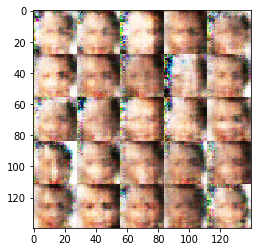

Epoch 1/1... Discriminator Loss: 0.9589... Generator Loss: 5.5133
Epoch 1/1... Discriminator Loss: 0.5032... Generator Loss: 2.7654
Epoch 1/1... Discriminator Loss: 0.5924... Generator Loss: 2.4316
Epoch 1/1... Discriminator Loss: 0.4916... Generator Loss: 2.3309
Epoch 1/1... Discriminator Loss: 0.4909... Generator Loss: 2.9043
Epoch 1/1... Discriminator Loss: 0.6811... Generator Loss: 1.2890
Epoch 1/1... Discriminator Loss: 0.4360... Generator Loss: 3.5797
Epoch 1/1... Discriminator Loss: 0.9314... Generator Loss: 1.1994
Epoch 1/1... Discriminator Loss: 0.5974... Generator Loss: 1.9723
Epoch 1/1... Discriminator Loss: 0.8582... Generator Loss: 1.4927


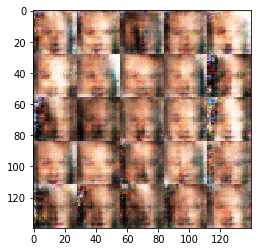

Epoch 1/1... Discriminator Loss: 0.4497... Generator Loss: 3.3857
Epoch 1/1... Discriminator Loss: 0.9308... Generator Loss: 1.5016
Epoch 1/1... Discriminator Loss: 0.6063... Generator Loss: 2.5016
Epoch 1/1... Discriminator Loss: 0.9330... Generator Loss: 1.4916
Epoch 1/1... Discriminator Loss: 1.5210... Generator Loss: 2.3144
Epoch 1/1... Discriminator Loss: 0.5903... Generator Loss: 2.1749
Epoch 1/1... Discriminator Loss: 1.4187... Generator Loss: 0.5750
Epoch 1/1... Discriminator Loss: 0.9829... Generator Loss: 2.3184
Epoch 1/1... Discriminator Loss: 0.6159... Generator Loss: 1.7127
Epoch 1/1... Discriminator Loss: 0.7151... Generator Loss: 1.5959


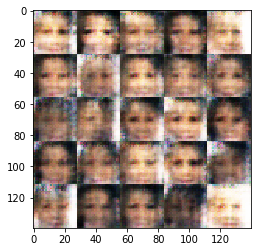

Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.5474
Epoch 1/1... Discriminator Loss: 0.5510... Generator Loss: 3.0159
Epoch 1/1... Discriminator Loss: 0.9933... Generator Loss: 0.8303
Epoch 1/1... Discriminator Loss: 1.2204... Generator Loss: 1.4086
Epoch 1/1... Discriminator Loss: 0.8820... Generator Loss: 1.4559
Epoch 1/1... Discriminator Loss: 0.5559... Generator Loss: 2.2114
Epoch 1/1... Discriminator Loss: 0.9855... Generator Loss: 1.9370
Epoch 1/1... Discriminator Loss: 0.8383... Generator Loss: 1.6258
Epoch 1/1... Discriminator Loss: 0.9461... Generator Loss: 0.7572
Epoch 1/1... Discriminator Loss: 0.6646... Generator Loss: 1.2976


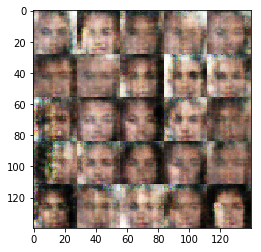

Epoch 1/1... Discriminator Loss: 0.7023... Generator Loss: 1.7828
Epoch 1/1... Discriminator Loss: 0.6575... Generator Loss: 1.8602
Epoch 1/1... Discriminator Loss: 0.6424... Generator Loss: 2.4501
Epoch 1/1... Discriminator Loss: 1.5255... Generator Loss: 0.7497
Epoch 1/1... Discriminator Loss: 0.9128... Generator Loss: 0.7858
Epoch 1/1... Discriminator Loss: 0.5915... Generator Loss: 1.5025
Epoch 1/1... Discriminator Loss: 0.8678... Generator Loss: 1.6625
Epoch 1/1... Discriminator Loss: 1.0908... Generator Loss: 2.9908
Epoch 1/1... Discriminator Loss: 1.0346... Generator Loss: 1.6733
Epoch 1/1... Discriminator Loss: 0.9147... Generator Loss: 1.4721


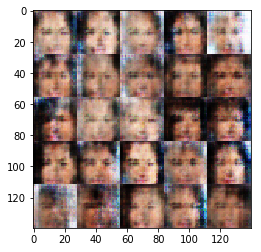

Epoch 1/1... Discriminator Loss: 0.6183... Generator Loss: 1.7704
Epoch 1/1... Discriminator Loss: 1.0364... Generator Loss: 0.8400
Epoch 1/1... Discriminator Loss: 1.0922... Generator Loss: 1.4948
Epoch 1/1... Discriminator Loss: 0.8401... Generator Loss: 1.5296
Epoch 1/1... Discriminator Loss: 0.8904... Generator Loss: 1.8856
Epoch 1/1... Discriminator Loss: 0.5504... Generator Loss: 2.8409
Epoch 1/1... Discriminator Loss: 0.7636... Generator Loss: 1.6114
Epoch 1/1... Discriminator Loss: 0.6374... Generator Loss: 2.0205
Epoch 1/1... Discriminator Loss: 1.2382... Generator Loss: 0.7397
Epoch 1/1... Discriminator Loss: 1.6973... Generator Loss: 0.4842


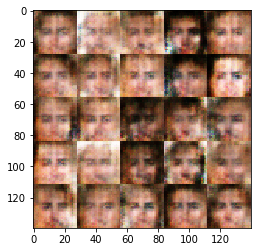

Epoch 1/1... Discriminator Loss: 0.5625... Generator Loss: 1.4739
Epoch 1/1... Discriminator Loss: 1.1709... Generator Loss: 0.8995
Epoch 1/1... Discriminator Loss: 0.9071... Generator Loss: 3.2161
Epoch 1/1... Discriminator Loss: 0.7100... Generator Loss: 1.3015
Epoch 1/1... Discriminator Loss: 0.7160... Generator Loss: 1.8161
Epoch 1/1... Discriminator Loss: 0.7666... Generator Loss: 1.8775
Epoch 1/1... Discriminator Loss: 0.5917... Generator Loss: 1.7418
Epoch 1/1... Discriminator Loss: 1.0368... Generator Loss: 1.0148
Epoch 1/1... Discriminator Loss: 1.8971... Generator Loss: 0.7447
Epoch 1/1... Discriminator Loss: 0.8964... Generator Loss: 2.4298


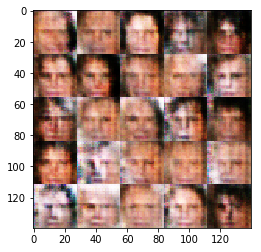

Epoch 1/1... Discriminator Loss: 1.9410... Generator Loss: 0.3935
Epoch 1/1... Discriminator Loss: 0.7516... Generator Loss: 1.1751
Epoch 1/1... Discriminator Loss: 1.5524... Generator Loss: 0.8773
Epoch 1/1... Discriminator Loss: 0.7236... Generator Loss: 1.8032
Epoch 1/1... Discriminator Loss: 1.5082... Generator Loss: 0.7525
Epoch 1/1... Discriminator Loss: 0.7373... Generator Loss: 1.2959
Epoch 1/1... Discriminator Loss: 0.7784... Generator Loss: 1.7503
Epoch 1/1... Discriminator Loss: 1.8761... Generator Loss: 0.5447
Epoch 1/1... Discriminator Loss: 0.6821... Generator Loss: 1.7100
Epoch 1/1... Discriminator Loss: 0.6195... Generator Loss: 3.0779


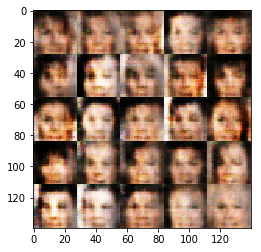

Epoch 1/1... Discriminator Loss: 0.6986... Generator Loss: 1.0995
Epoch 1/1... Discriminator Loss: 0.8204... Generator Loss: 2.5464
Epoch 1/1... Discriminator Loss: 1.1544... Generator Loss: 1.2228
Epoch 1/1... Discriminator Loss: 0.7626... Generator Loss: 1.2685
Epoch 1/1... Discriminator Loss: 0.9671... Generator Loss: 1.6377
Epoch 1/1... Discriminator Loss: 0.8726... Generator Loss: 1.1871
Epoch 1/1... Discriminator Loss: 0.6113... Generator Loss: 2.9681
Epoch 1/1... Discriminator Loss: 0.8401... Generator Loss: 2.8222
Epoch 1/1... Discriminator Loss: 1.0072... Generator Loss: 2.6610
Epoch 1/1... Discriminator Loss: 0.6274... Generator Loss: 1.2651


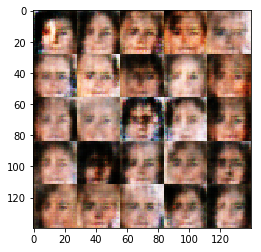

Epoch 1/1... Discriminator Loss: 0.6091... Generator Loss: 1.7891
Epoch 1/1... Discriminator Loss: 1.5275... Generator Loss: 0.4775
Epoch 1/1... Discriminator Loss: 0.9482... Generator Loss: 4.4848
Epoch 1/1... Discriminator Loss: 0.8111... Generator Loss: 1.3924
Epoch 1/1... Discriminator Loss: 0.6526... Generator Loss: 3.7405
Epoch 1/1... Discriminator Loss: 0.6841... Generator Loss: 1.6793
Epoch 1/1... Discriminator Loss: 0.7546... Generator Loss: 1.7794
Epoch 1/1... Discriminator Loss: 0.8819... Generator Loss: 1.9689
Epoch 1/1... Discriminator Loss: 2.3080... Generator Loss: 0.4525
Epoch 1/1... Discriminator Loss: 1.1391... Generator Loss: 0.7563


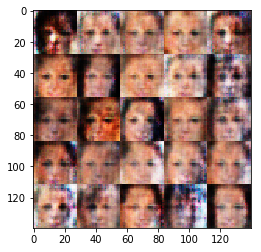

Epoch 1/1... Discriminator Loss: 0.4969... Generator Loss: 2.0576
Epoch 1/1... Discriminator Loss: 0.8145... Generator Loss: 1.8853
Epoch 1/1... Discriminator Loss: 0.9652... Generator Loss: 3.8133
Epoch 1/1... Discriminator Loss: 0.9224... Generator Loss: 0.7054
Epoch 1/1... Discriminator Loss: 0.8863... Generator Loss: 1.0039
Epoch 1/1... Discriminator Loss: 0.6384... Generator Loss: 1.0636
Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.6275
Epoch 1/1... Discriminator Loss: 1.3956... Generator Loss: 0.9573
Epoch 1/1... Discriminator Loss: 1.4830... Generator Loss: 1.7337
Epoch 1/1... Discriminator Loss: 0.9791... Generator Loss: 2.4529


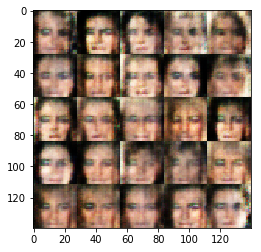

Epoch 1/1... Discriminator Loss: 0.7492... Generator Loss: 1.1832
Epoch 1/1... Discriminator Loss: 0.8995... Generator Loss: 1.6516
Epoch 1/1... Discriminator Loss: 1.2017... Generator Loss: 0.8292
Epoch 1/1... Discriminator Loss: 1.2714... Generator Loss: 1.4705
Epoch 1/1... Discriminator Loss: 0.5290... Generator Loss: 2.0027
Epoch 1/1... Discriminator Loss: 0.9299... Generator Loss: 1.0100
Epoch 1/1... Discriminator Loss: 0.9587... Generator Loss: 1.3774
Epoch 1/1... Discriminator Loss: 0.9165... Generator Loss: 0.8683
Epoch 1/1... Discriminator Loss: 0.6519... Generator Loss: 1.7994
Epoch 1/1... Discriminator Loss: 0.4559... Generator Loss: 2.4263


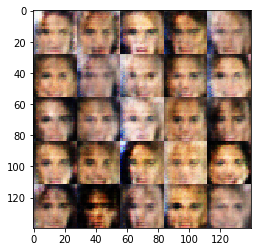

Epoch 1/1... Discriminator Loss: 0.9652... Generator Loss: 1.7614
Epoch 1/1... Discriminator Loss: 1.4305... Generator Loss: 0.7596
Epoch 1/1... Discriminator Loss: 0.5326... Generator Loss: 1.9303
Epoch 1/1... Discriminator Loss: 2.0569... Generator Loss: 0.7410
Epoch 1/1... Discriminator Loss: 0.9598... Generator Loss: 1.0105
Epoch 1/1... Discriminator Loss: 0.5590... Generator Loss: 1.8088
Epoch 1/1... Discriminator Loss: 0.8704... Generator Loss: 1.9384
Epoch 1/1... Discriminator Loss: 0.4122... Generator Loss: 2.6053
Epoch 1/1... Discriminator Loss: 1.1041... Generator Loss: 1.4043
Epoch 1/1... Discriminator Loss: 0.5493... Generator Loss: 1.3144


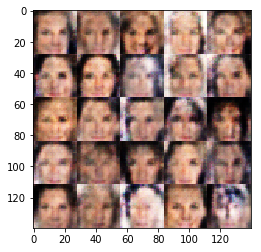

Epoch 1/1... Discriminator Loss: 0.9518... Generator Loss: 1.3229
Epoch 1/1... Discriminator Loss: 1.0351... Generator Loss: 1.3784
Epoch 1/1... Discriminator Loss: 1.0015... Generator Loss: 0.9981
Epoch 1/1... Discriminator Loss: 0.9495... Generator Loss: 0.8638
Epoch 1/1... Discriminator Loss: 0.6474... Generator Loss: 2.0944
Epoch 1/1... Discriminator Loss: 1.3285... Generator Loss: 0.8602
Epoch 1/1... Discriminator Loss: 0.9171... Generator Loss: 1.1360
Epoch 1/1... Discriminator Loss: 0.5852... Generator Loss: 2.1750
Epoch 1/1... Discriminator Loss: 1.1055... Generator Loss: 1.0799
Epoch 1/1... Discriminator Loss: 1.0924... Generator Loss: 0.6272


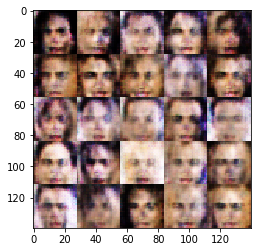

Epoch 1/1... Discriminator Loss: 1.6575... Generator Loss: 0.5458
Epoch 1/1... Discriminator Loss: 0.7456... Generator Loss: 1.3668
Epoch 1/1... Discriminator Loss: 0.9152... Generator Loss: 1.1117
Epoch 1/1... Discriminator Loss: 0.8890... Generator Loss: 0.8621
Epoch 1/1... Discriminator Loss: 0.7066... Generator Loss: 1.9135
Epoch 1/1... Discriminator Loss: 0.7240... Generator Loss: 2.8036
Epoch 1/1... Discriminator Loss: 0.9627... Generator Loss: 1.3746
Epoch 1/1... Discriminator Loss: 0.9428... Generator Loss: 2.2055
Epoch 1/1... Discriminator Loss: 0.5689... Generator Loss: 1.2483
Epoch 1/1... Discriminator Loss: 1.0164... Generator Loss: 1.1006


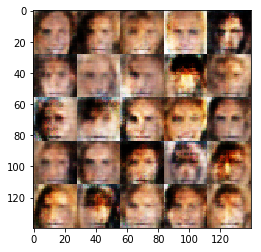

Epoch 1/1... Discriminator Loss: 1.1969... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 0.6320... Generator Loss: 1.4298
Epoch 1/1... Discriminator Loss: 0.8509... Generator Loss: 1.1055
Epoch 1/1... Discriminator Loss: 1.0561... Generator Loss: 1.0655
Epoch 1/1... Discriminator Loss: 0.8680... Generator Loss: 1.1395
Epoch 1/1... Discriminator Loss: 0.5494... Generator Loss: 2.5155
Epoch 1/1... Discriminator Loss: 0.6522... Generator Loss: 1.3624
Epoch 1/1... Discriminator Loss: 0.7832... Generator Loss: 0.9319
Epoch 1/1... Discriminator Loss: 1.3302... Generator Loss: 1.5917
Epoch 1/1... Discriminator Loss: 0.5229... Generator Loss: 2.2365


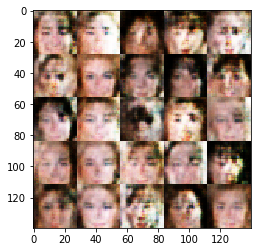

Epoch 1/1... Discriminator Loss: 1.2329... Generator Loss: 0.9365
Epoch 1/1... Discriminator Loss: 1.3828... Generator Loss: 0.7209
Epoch 1/1... Discriminator Loss: 0.7053... Generator Loss: 2.6178
Epoch 1/1... Discriminator Loss: 1.3796... Generator Loss: 0.7047
Epoch 1/1... Discriminator Loss: 0.4526... Generator Loss: 2.8979
Epoch 1/1... Discriminator Loss: 1.0785... Generator Loss: 0.6507
Epoch 1/1... Discriminator Loss: 0.8002... Generator Loss: 1.8671
Epoch 1/1... Discriminator Loss: 0.9024... Generator Loss: 1.5346
Epoch 1/1... Discriminator Loss: 1.0122... Generator Loss: 0.5924
Epoch 1/1... Discriminator Loss: 0.7788... Generator Loss: 2.8306


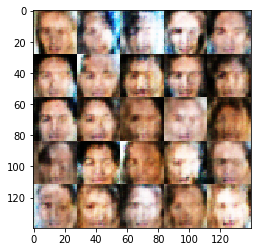

Epoch 1/1... Discriminator Loss: 0.6851... Generator Loss: 2.0362
Epoch 1/1... Discriminator Loss: 0.6518... Generator Loss: 1.9754
Epoch 1/1... Discriminator Loss: 0.6960... Generator Loss: 2.1079
Epoch 1/1... Discriminator Loss: 0.9949... Generator Loss: 2.2431
Epoch 1/1... Discriminator Loss: 1.1469... Generator Loss: 1.2446
Epoch 1/1... Discriminator Loss: 0.6382... Generator Loss: 1.7745
Epoch 1/1... Discriminator Loss: 0.7026... Generator Loss: 1.5152
Epoch 1/1... Discriminator Loss: 0.8016... Generator Loss: 1.8503
Epoch 1/1... Discriminator Loss: 0.6069... Generator Loss: 1.5461
Epoch 1/1... Discriminator Loss: 0.5883... Generator Loss: 1.2523


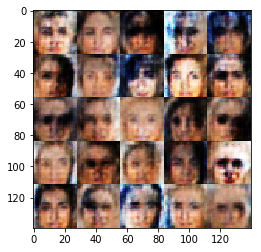

Epoch 1/1... Discriminator Loss: 0.8414... Generator Loss: 1.5577
Epoch 1/1... Discriminator Loss: 0.8043... Generator Loss: 3.1893
Epoch 1/1... Discriminator Loss: 0.8356... Generator Loss: 1.4744
Epoch 1/1... Discriminator Loss: 0.6495... Generator Loss: 1.6151
Epoch 1/1... Discriminator Loss: 0.5169... Generator Loss: 2.0280
Epoch 1/1... Discriminator Loss: 0.8035... Generator Loss: 1.7413
Epoch 1/1... Discriminator Loss: 1.1585... Generator Loss: 1.9475
Epoch 1/1... Discriminator Loss: 0.8595... Generator Loss: 0.7927
Epoch 1/1... Discriminator Loss: 0.6761... Generator Loss: 0.8031
Epoch 1/1... Discriminator Loss: 1.1083... Generator Loss: 1.1641


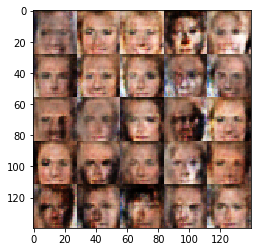

Epoch 1/1... Discriminator Loss: 0.6714... Generator Loss: 3.4859
Epoch 1/1... Discriminator Loss: 0.6387... Generator Loss: 1.0987
Epoch 1/1... Discriminator Loss: 0.6383... Generator Loss: 1.4275
Epoch 1/1... Discriminator Loss: 0.5409... Generator Loss: 1.5608
Epoch 1/1... Discriminator Loss: 1.6323... Generator Loss: 0.5343
Epoch 1/1... Discriminator Loss: 0.5935... Generator Loss: 1.8989
Epoch 1/1... Discriminator Loss: 0.8659... Generator Loss: 0.8484
Epoch 1/1... Discriminator Loss: 0.9786... Generator Loss: 1.0028
Epoch 1/1... Discriminator Loss: 0.6558... Generator Loss: 2.5667
Epoch 1/1... Discriminator Loss: 0.6994... Generator Loss: 2.7570


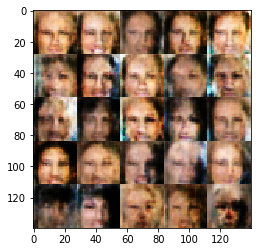

Epoch 1/1... Discriminator Loss: 0.7026... Generator Loss: 1.7023
Epoch 1/1... Discriminator Loss: 1.2379... Generator Loss: 1.0736
Epoch 1/1... Discriminator Loss: 0.5768... Generator Loss: 2.1826
Epoch 1/1... Discriminator Loss: 0.4223... Generator Loss: 2.3038
Epoch 1/1... Discriminator Loss: 0.9365... Generator Loss: 2.2270
Epoch 1/1... Discriminator Loss: 1.1201... Generator Loss: 1.2971
Epoch 1/1... Discriminator Loss: 0.8081... Generator Loss: 1.3335
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 0.9545
Epoch 1/1... Discriminator Loss: 0.9065... Generator Loss: 1.4222
Epoch 1/1... Discriminator Loss: 1.0403... Generator Loss: 0.7546


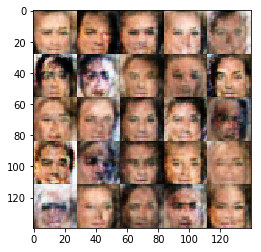

Epoch 1/1... Discriminator Loss: 0.6910... Generator Loss: 1.3078
Epoch 1/1... Discriminator Loss: 0.6944... Generator Loss: 2.4859
Epoch 1/1... Discriminator Loss: 0.9664... Generator Loss: 1.7333
Epoch 1/1... Discriminator Loss: 0.7088... Generator Loss: 1.9957
Epoch 1/1... Discriminator Loss: 1.2569... Generator Loss: 0.7888
Epoch 1/1... Discriminator Loss: 0.9919... Generator Loss: 2.6732
Epoch 1/1... Discriminator Loss: 0.6862... Generator Loss: 1.5314
Epoch 1/1... Discriminator Loss: 0.8303... Generator Loss: 1.0607
Epoch 1/1... Discriminator Loss: 0.6113... Generator Loss: 1.8442
Epoch 1/1... Discriminator Loss: 0.6111... Generator Loss: 0.8735


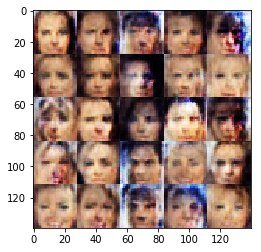

Epoch 1/1... Discriminator Loss: 1.0869... Generator Loss: 1.1960
Epoch 1/1... Discriminator Loss: 1.1852... Generator Loss: 1.7353
Epoch 1/1... Discriminator Loss: 0.5315... Generator Loss: 1.9649
Epoch 1/1... Discriminator Loss: 0.8677... Generator Loss: 0.9805
Epoch 1/1... Discriminator Loss: 0.8285... Generator Loss: 1.7592
Epoch 1/1... Discriminator Loss: 1.0824... Generator Loss: 1.2597
Epoch 1/1... Discriminator Loss: 0.6856... Generator Loss: 1.9287
Epoch 1/1... Discriminator Loss: 0.6428... Generator Loss: 2.6824
Epoch 1/1... Discriminator Loss: 0.8659... Generator Loss: 1.0445
Epoch 1/1... Discriminator Loss: 0.9739... Generator Loss: 1.6516


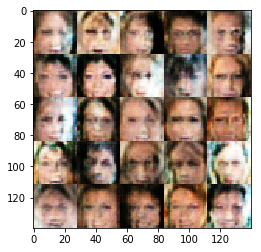

Epoch 1/1... Discriminator Loss: 0.6958... Generator Loss: 2.0268
Epoch 1/1... Discriminator Loss: 0.6022... Generator Loss: 2.3726
Epoch 1/1... Discriminator Loss: 0.5311... Generator Loss: 1.9720
Epoch 1/1... Discriminator Loss: 0.7196... Generator Loss: 1.4031
Epoch 1/1... Discriminator Loss: 0.5581... Generator Loss: 2.0987
Epoch 1/1... Discriminator Loss: 0.7559... Generator Loss: 2.0151
Epoch 1/1... Discriminator Loss: 0.6509... Generator Loss: 2.4009
Epoch 1/1... Discriminator Loss: 0.6227... Generator Loss: 2.5708
Epoch 1/1... Discriminator Loss: 0.6888... Generator Loss: 1.0124
Epoch 1/1... Discriminator Loss: 0.7500... Generator Loss: 2.2454


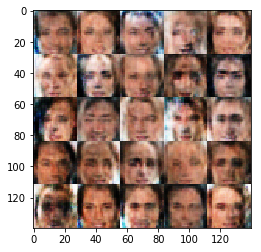

Epoch 1/1... Discriminator Loss: 0.7231... Generator Loss: 2.0352
Epoch 1/1... Discriminator Loss: 0.5653... Generator Loss: 2.2080
Epoch 1/1... Discriminator Loss: 0.4277... Generator Loss: 3.1821
Epoch 1/1... Discriminator Loss: 0.9994... Generator Loss: 1.3300
Epoch 1/1... Discriminator Loss: 1.4253... Generator Loss: 2.7352
Epoch 1/1... Discriminator Loss: 0.7362... Generator Loss: 1.5608
Epoch 1/1... Discriminator Loss: 0.9916... Generator Loss: 1.0546
Epoch 1/1... Discriminator Loss: 0.7635... Generator Loss: 1.7380
Epoch 1/1... Discriminator Loss: 0.5296... Generator Loss: 1.9151
Epoch 1/1... Discriminator Loss: 0.8079... Generator Loss: 0.9938


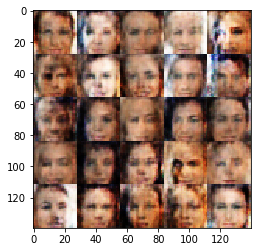

Epoch 1/1... Discriminator Loss: 0.6675... Generator Loss: 3.3213
Epoch 1/1... Discriminator Loss: 0.9662... Generator Loss: 0.6926
Epoch 1/1... Discriminator Loss: 1.1032... Generator Loss: 0.8791
Epoch 1/1... Discriminator Loss: 1.1721... Generator Loss: 1.2192
Epoch 1/1... Discriminator Loss: 1.4049... Generator Loss: 2.1286
Epoch 1/1... Discriminator Loss: 0.7146... Generator Loss: 2.5681
Epoch 1/1... Discriminator Loss: 0.6669... Generator Loss: 1.6353
Epoch 1/1... Discriminator Loss: 0.5713... Generator Loss: 1.9299
Epoch 1/1... Discriminator Loss: 0.5539... Generator Loss: 2.0931
Epoch 1/1... Discriminator Loss: 0.6591... Generator Loss: 3.0626


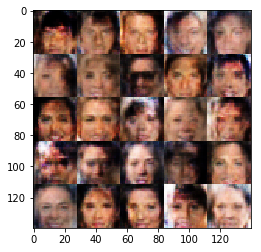

Epoch 1/1... Discriminator Loss: 1.0471... Generator Loss: 1.1981
Epoch 1/1... Discriminator Loss: 0.6569... Generator Loss: 2.0637
Epoch 1/1... Discriminator Loss: 0.6113... Generator Loss: 1.9194
Epoch 1/1... Discriminator Loss: 0.9023... Generator Loss: 0.9719
Epoch 1/1... Discriminator Loss: 0.6598... Generator Loss: 2.4088
Epoch 1/1... Discriminator Loss: 1.1562... Generator Loss: 1.1882
Epoch 1/1... Discriminator Loss: 1.0302... Generator Loss: 1.0735
Epoch 1/1... Discriminator Loss: 0.6249... Generator Loss: 2.1278
Epoch 1/1... Discriminator Loss: 1.0982... Generator Loss: 1.2543
Epoch 1/1... Discriminator Loss: 0.6443... Generator Loss: 2.6830


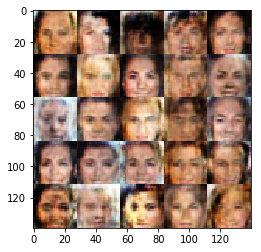

Epoch 1/1... Discriminator Loss: 0.4817... Generator Loss: 1.9663
Epoch 1/1... Discriminator Loss: 0.8357... Generator Loss: 1.9125
Epoch 1/1... Discriminator Loss: 0.5619... Generator Loss: 1.0136
Epoch 1/1... Discriminator Loss: 0.9424... Generator Loss: 1.6490
Epoch 1/1... Discriminator Loss: 0.8850... Generator Loss: 0.8144
Epoch 1/1... Discriminator Loss: 1.1966... Generator Loss: 0.6324
Epoch 1/1... Discriminator Loss: 0.7387... Generator Loss: 1.1840
Epoch 1/1... Discriminator Loss: 1.1386... Generator Loss: 1.2598
Epoch 1/1... Discriminator Loss: 0.9242... Generator Loss: 1.6202
Epoch 1/1... Discriminator Loss: 0.6449... Generator Loss: 1.8793


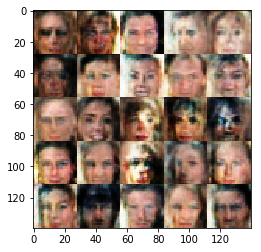

Epoch 1/1... Discriminator Loss: 0.6249... Generator Loss: 2.2706
Epoch 1/1... Discriminator Loss: 1.1713... Generator Loss: 0.7113
Epoch 1/1... Discriminator Loss: 0.7093... Generator Loss: 1.9411
Epoch 1/1... Discriminator Loss: 1.3321... Generator Loss: 1.0310
Epoch 1/1... Discriminator Loss: 0.5722... Generator Loss: 3.1380
Epoch 1/1... Discriminator Loss: 0.7865... Generator Loss: 1.4939
Epoch 1/1... Discriminator Loss: 0.6978... Generator Loss: 0.9680
Epoch 1/1... Discriminator Loss: 0.5985... Generator Loss: 2.1365
Epoch 1/1... Discriminator Loss: 1.0918... Generator Loss: 2.5015
Epoch 1/1... Discriminator Loss: 0.8326... Generator Loss: 1.0644


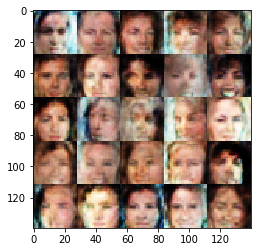

Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 1.9646
Epoch 1/1... Discriminator Loss: 0.5657... Generator Loss: 1.3455
Epoch 1/1... Discriminator Loss: 1.2239... Generator Loss: 1.7539
Epoch 1/1... Discriminator Loss: 0.6270... Generator Loss: 2.2265
Epoch 1/1... Discriminator Loss: 0.8167... Generator Loss: 2.1676
Epoch 1/1... Discriminator Loss: 1.0377... Generator Loss: 2.3515
Epoch 1/1... Discriminator Loss: 0.5669... Generator Loss: 2.4765
Epoch 1/1... Discriminator Loss: 0.8829... Generator Loss: 1.1613
Epoch 1/1... Discriminator Loss: 0.7294... Generator Loss: 1.3438
Epoch 1/1... Discriminator Loss: 0.5920... Generator Loss: 1.8594


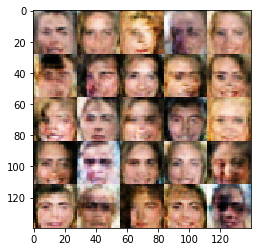

Epoch 1/1... Discriminator Loss: 0.9587... Generator Loss: 0.9345
Epoch 1/1... Discriminator Loss: 0.9747... Generator Loss: 1.9841
Epoch 1/1... Discriminator Loss: 0.7179... Generator Loss: 1.4732
Epoch 1/1... Discriminator Loss: 0.8409... Generator Loss: 0.7572
Epoch 1/1... Discriminator Loss: 1.1081... Generator Loss: 1.1888
Epoch 1/1... Discriminator Loss: 0.9952... Generator Loss: 1.6522
Epoch 1/1... Discriminator Loss: 1.1531... Generator Loss: 1.1768
Epoch 1/1... Discriminator Loss: 0.6287... Generator Loss: 1.1345
Epoch 1/1... Discriminator Loss: 0.5436... Generator Loss: 1.3393
Epoch 1/1... Discriminator Loss: 0.5868... Generator Loss: 2.1446


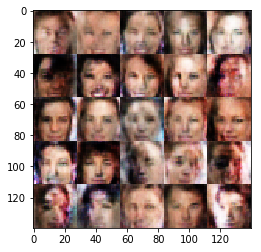

Epoch 1/1... Discriminator Loss: 0.9888... Generator Loss: 1.5411
Epoch 1/1... Discriminator Loss: 0.7650... Generator Loss: 1.1174
Epoch 1/1... Discriminator Loss: 0.8075... Generator Loss: 1.1631
Epoch 1/1... Discriminator Loss: 0.7077... Generator Loss: 1.2782
Epoch 1/1... Discriminator Loss: 0.6108... Generator Loss: 1.6981
Epoch 1/1... Discriminator Loss: 1.1086... Generator Loss: 2.3379
Epoch 1/1... Discriminator Loss: 0.5976... Generator Loss: 1.5380
Epoch 1/1... Discriminator Loss: 0.8520... Generator Loss: 1.5784
Epoch 1/1... Discriminator Loss: 1.0087... Generator Loss: 2.5552
Epoch 1/1... Discriminator Loss: 1.4332... Generator Loss: 0.9852


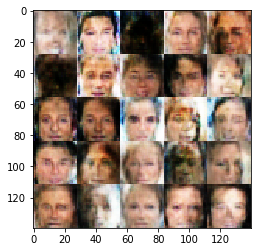

Epoch 1/1... Discriminator Loss: 0.8239... Generator Loss: 1.5573
Epoch 1/1... Discriminator Loss: 1.0288... Generator Loss: 0.8371
Epoch 1/1... Discriminator Loss: 0.7352... Generator Loss: 1.3394
Epoch 1/1... Discriminator Loss: 0.7550... Generator Loss: 2.0209
Epoch 1/1... Discriminator Loss: 0.6665... Generator Loss: 2.6697
Epoch 1/1... Discriminator Loss: 1.2606... Generator Loss: 1.0410
Epoch 1/1... Discriminator Loss: 0.6393... Generator Loss: 1.4950
Epoch 1/1... Discriminator Loss: 0.7781... Generator Loss: 2.5167
Epoch 1/1... Discriminator Loss: 1.3233... Generator Loss: 1.7154
Epoch 1/1... Discriminator Loss: 1.4935... Generator Loss: 1.4762


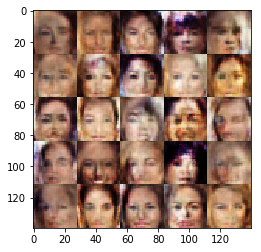

Epoch 1/1... Discriminator Loss: 0.8106... Generator Loss: 1.3962
Epoch 1/1... Discriminator Loss: 0.9114... Generator Loss: 0.8018
Epoch 1/1... Discriminator Loss: 0.7922... Generator Loss: 1.2272
Epoch 1/1... Discriminator Loss: 0.7791... Generator Loss: 1.3441
Epoch 1/1... Discriminator Loss: 0.6599... Generator Loss: 2.2340
Epoch 1/1... Discriminator Loss: 0.6396... Generator Loss: 2.1973
Epoch 1/1... Discriminator Loss: 0.5567... Generator Loss: 2.3746
Epoch 1/1... Discriminator Loss: 0.7037... Generator Loss: 1.9737
Epoch 1/1... Discriminator Loss: 0.9820... Generator Loss: 1.0966
Epoch 1/1... Discriminator Loss: 1.4115... Generator Loss: 0.9751


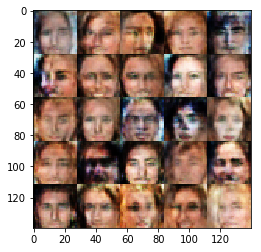

Epoch 1/1... Discriminator Loss: 0.8078... Generator Loss: 1.1833
Epoch 1/1... Discriminator Loss: 1.1004... Generator Loss: 0.9294
Epoch 1/1... Discriminator Loss: 1.2256... Generator Loss: 1.2267
Epoch 1/1... Discriminator Loss: 1.2842... Generator Loss: 0.9946
Epoch 1/1... Discriminator Loss: 0.7545... Generator Loss: 1.6198
Epoch 1/1... Discriminator Loss: 0.5504... Generator Loss: 1.6880
Epoch 1/1... Discriminator Loss: 0.8864... Generator Loss: 1.1069
Epoch 1/1... Discriminator Loss: 1.4099... Generator Loss: 2.3477
Epoch 1/1... Discriminator Loss: 0.7135... Generator Loss: 2.0945
Epoch 1/1... Discriminator Loss: 0.5215... Generator Loss: 1.7324


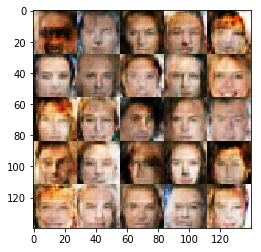

Epoch 1/1... Discriminator Loss: 0.7458... Generator Loss: 1.5032
Epoch 1/1... Discriminator Loss: 0.9555... Generator Loss: 0.7198
Epoch 1/1... Discriminator Loss: 0.8880... Generator Loss: 1.4274
Epoch 1/1... Discriminator Loss: 0.7731... Generator Loss: 2.7379
Epoch 1/1... Discriminator Loss: 0.6673... Generator Loss: 1.8088
Epoch 1/1... Discriminator Loss: 0.5784... Generator Loss: 2.6695
Epoch 1/1... Discriminator Loss: 1.0166... Generator Loss: 2.0557
Epoch 1/1... Discriminator Loss: 0.9418... Generator Loss: 1.7898
Epoch 1/1... Discriminator Loss: 0.8889... Generator Loss: 0.6614
Epoch 1/1... Discriminator Loss: 0.8641... Generator Loss: 0.9336


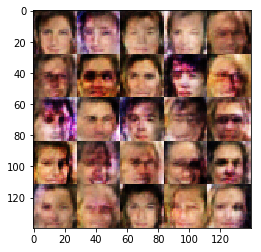

Epoch 1/1... Discriminator Loss: 0.9119... Generator Loss: 0.7753
Epoch 1/1... Discriminator Loss: 0.4862... Generator Loss: 1.9997
Epoch 1/1... Discriminator Loss: 0.7719... Generator Loss: 1.5143
Epoch 1/1... Discriminator Loss: 1.6051... Generator Loss: 0.8187
Epoch 1/1... Discriminator Loss: 0.6474... Generator Loss: 1.1031
Epoch 1/1... Discriminator Loss: 1.2750... Generator Loss: 0.7877
Epoch 1/1... Discriminator Loss: 0.7200... Generator Loss: 1.5379
Epoch 1/1... Discriminator Loss: 1.3501... Generator Loss: 0.6369
Epoch 1/1... Discriminator Loss: 0.9133... Generator Loss: 1.1423
Epoch 1/1... Discriminator Loss: 0.5132... Generator Loss: 1.4932


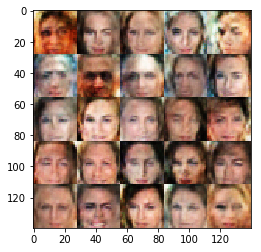

Epoch 1/1... Discriminator Loss: 0.7298... Generator Loss: 1.4156
Epoch 1/1... Discriminator Loss: 0.8005... Generator Loss: 2.7771
Epoch 1/1... Discriminator Loss: 0.7130... Generator Loss: 1.4693
Epoch 1/1... Discriminator Loss: 0.8164... Generator Loss: 1.0632
Epoch 1/1... Discriminator Loss: 0.8252... Generator Loss: 1.2455
Epoch 1/1... Discriminator Loss: 1.2074... Generator Loss: 3.7138
Epoch 1/1... Discriminator Loss: 1.2769... Generator Loss: 2.4896
Epoch 1/1... Discriminator Loss: 0.6407... Generator Loss: 1.4162
Epoch 1/1... Discriminator Loss: 0.8653... Generator Loss: 1.9781
Epoch 1/1... Discriminator Loss: 0.7909... Generator Loss: 1.5416


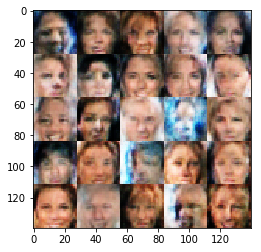

Epoch 1/1... Discriminator Loss: 0.8921... Generator Loss: 1.0247
Epoch 1/1... Discriminator Loss: 1.1097... Generator Loss: 1.2047
Epoch 1/1... Discriminator Loss: 1.1391... Generator Loss: 0.3850
Epoch 1/1... Discriminator Loss: 0.8021... Generator Loss: 1.7663
Epoch 1/1... Discriminator Loss: 0.4599... Generator Loss: 2.2720
Epoch 1/1... Discriminator Loss: 0.8600... Generator Loss: 0.8946
Epoch 1/1... Discriminator Loss: 0.8818... Generator Loss: 1.2091
Epoch 1/1... Discriminator Loss: 0.9406... Generator Loss: 2.3380
Epoch 1/1... Discriminator Loss: 0.8274... Generator Loss: 0.7686
Epoch 1/1... Discriminator Loss: 0.6073... Generator Loss: 1.7141


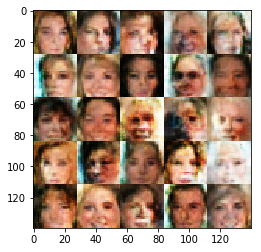

Epoch 1/1... Discriminator Loss: 1.2053... Generator Loss: 1.4118
Epoch 1/1... Discriminator Loss: 0.5896... Generator Loss: 1.1478
Epoch 1/1... Discriminator Loss: 0.9639... Generator Loss: 1.2761
Epoch 1/1... Discriminator Loss: 0.8470... Generator Loss: 1.7408
Epoch 1/1... Discriminator Loss: 0.8783... Generator Loss: 1.7121
Epoch 1/1... Discriminator Loss: 0.7048... Generator Loss: 1.4019
Epoch 1/1... Discriminator Loss: 0.6268... Generator Loss: 1.8938
Epoch 1/1... Discriminator Loss: 0.9998... Generator Loss: 1.8449
Epoch 1/1... Discriminator Loss: 0.7425... Generator Loss: 3.0855
Epoch 1/1... Discriminator Loss: 1.1468... Generator Loss: 1.2541


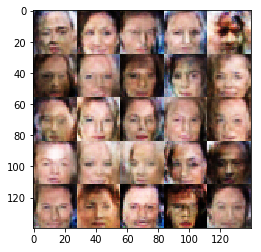

Epoch 1/1... Discriminator Loss: 1.2123... Generator Loss: 1.8674
Epoch 1/1... Discriminator Loss: 0.6403... Generator Loss: 1.3763
Epoch 1/1... Discriminator Loss: 0.6255... Generator Loss: 1.9530
Epoch 1/1... Discriminator Loss: 1.1657... Generator Loss: 0.6621
Epoch 1/1... Discriminator Loss: 1.1452... Generator Loss: 0.9793
Epoch 1/1... Discriminator Loss: 0.5978... Generator Loss: 1.1645
Epoch 1/1... Discriminator Loss: 0.5831... Generator Loss: 1.1381
Epoch 1/1... Discriminator Loss: 1.3709... Generator Loss: 0.6773
Epoch 1/1... Discriminator Loss: 0.6961... Generator Loss: 1.0357
Epoch 1/1... Discriminator Loss: 0.7946... Generator Loss: 1.8385


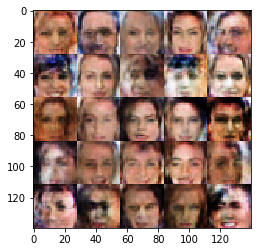

Epoch 1/1... Discriminator Loss: 0.7915... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 1.2169... Generator Loss: 0.8594
Epoch 1/1... Discriminator Loss: 0.5214... Generator Loss: 2.3554
Epoch 1/1... Discriminator Loss: 0.8729... Generator Loss: 2.3466
Epoch 1/1... Discriminator Loss: 0.7400... Generator Loss: 0.9966
Epoch 1/1... Discriminator Loss: 0.8426... Generator Loss: 1.0621
Epoch 1/1... Discriminator Loss: 1.0060... Generator Loss: 1.4080
Epoch 1/1... Discriminator Loss: 0.5670... Generator Loss: 2.7696
Epoch 1/1... Discriminator Loss: 0.8803... Generator Loss: 1.2289
Epoch 1/1... Discriminator Loss: 0.6565... Generator Loss: 1.5754


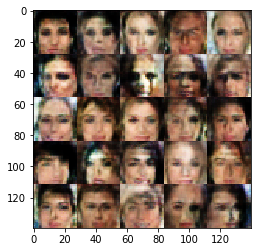

Epoch 1/1... Discriminator Loss: 0.5451... Generator Loss: 1.3064
Epoch 1/1... Discriminator Loss: 0.7179... Generator Loss: 2.1465
Epoch 1/1... Discriminator Loss: 0.6453... Generator Loss: 0.6943
Epoch 1/1... Discriminator Loss: 0.4676... Generator Loss: 2.5498
Epoch 1/1... Discriminator Loss: 0.5306... Generator Loss: 2.3853
Epoch 1/1... Discriminator Loss: 1.0283... Generator Loss: 1.7673
Epoch 1/1... Discriminator Loss: 0.6579... Generator Loss: 1.4987
Epoch 1/1... Discriminator Loss: 0.8832... Generator Loss: 0.8801
Epoch 1/1... Discriminator Loss: 1.1540... Generator Loss: 0.6323
Epoch 1/1... Discriminator Loss: 0.7354... Generator Loss: 2.1620


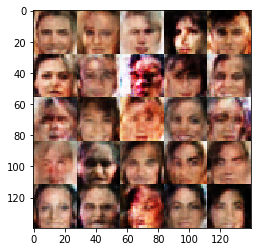

Epoch 1/1... Discriminator Loss: 0.6712... Generator Loss: 2.4729
Epoch 1/1... Discriminator Loss: 0.7669... Generator Loss: 2.3409
Epoch 1/1... Discriminator Loss: 0.7616... Generator Loss: 0.9875
Epoch 1/1... Discriminator Loss: 0.7673... Generator Loss: 0.9978
Epoch 1/1... Discriminator Loss: 0.6948... Generator Loss: 2.3201
Epoch 1/1... Discriminator Loss: 0.6777... Generator Loss: 1.6247
Epoch 1/1... Discriminator Loss: 1.0648... Generator Loss: 1.3297
Epoch 1/1... Discriminator Loss: 1.1469... Generator Loss: 0.8491
Epoch 1/1... Discriminator Loss: 0.6561... Generator Loss: 1.1462
Epoch 1/1... Discriminator Loss: 0.7003... Generator Loss: 1.9465


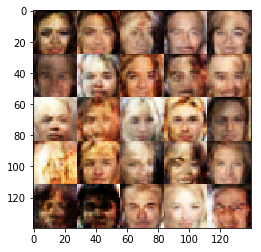

Epoch 1/1... Discriminator Loss: 1.0019... Generator Loss: 1.3642
Epoch 1/1... Discriminator Loss: 0.5733... Generator Loss: 2.6834
Epoch 1/1... Discriminator Loss: 0.5968... Generator Loss: 1.8542
Epoch 1/1... Discriminator Loss: 0.5388... Generator Loss: 1.0146
Epoch 1/1... Discriminator Loss: 0.4622... Generator Loss: 2.2586
Epoch 1/1... Discriminator Loss: 1.0983... Generator Loss: 0.9510
Epoch 1/1... Discriminator Loss: 1.9896... Generator Loss: 0.6319
Epoch 1/1... Discriminator Loss: 0.8025... Generator Loss: 1.2301
Epoch 1/1... Discriminator Loss: 0.7114... Generator Loss: 1.1349
Epoch 1/1... Discriminator Loss: 0.7979... Generator Loss: 1.0671


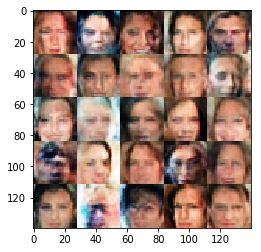

Epoch 1/1... Discriminator Loss: 0.6419... Generator Loss: 1.6147
Epoch 1/1... Discriminator Loss: 0.6442... Generator Loss: 1.3854
Epoch 1/1... Discriminator Loss: 0.5877... Generator Loss: 1.2864
Epoch 1/1... Discriminator Loss: 0.4227... Generator Loss: 1.8218
Epoch 1/1... Discriminator Loss: 0.6553... Generator Loss: 1.4313
Epoch 1/1... Discriminator Loss: 0.6321... Generator Loss: 2.3850
Epoch 1/1... Discriminator Loss: 0.5216... Generator Loss: 2.4267
Epoch 1/1... Discriminator Loss: 0.6447... Generator Loss: 1.6080
Epoch 1/1... Discriminator Loss: 0.8505... Generator Loss: 1.0346
Epoch 1/1... Discriminator Loss: 0.9395... Generator Loss: 0.7096


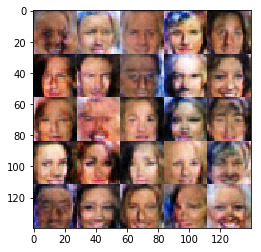

Epoch 1/1... Discriminator Loss: 0.8461... Generator Loss: 1.4744
Epoch 1/1... Discriminator Loss: 0.7213... Generator Loss: 2.0413
Epoch 1/1... Discriminator Loss: 1.1278... Generator Loss: 1.0376
Epoch 1/1... Discriminator Loss: 0.5733... Generator Loss: 1.9752
Epoch 1/1... Discriminator Loss: 0.6093... Generator Loss: 1.8373
Epoch 1/1... Discriminator Loss: 0.5350... Generator Loss: 1.8435
Epoch 1/1... Discriminator Loss: 0.9426... Generator Loss: 1.1987
Epoch 1/1... Discriminator Loss: 0.9828... Generator Loss: 1.7703
Epoch 1/1... Discriminator Loss: 0.6655... Generator Loss: 1.9429
Epoch 1/1... Discriminator Loss: 0.6721... Generator Loss: 3.0362


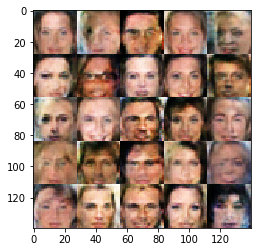

Epoch 1/1... Discriminator Loss: 0.5118... Generator Loss: 0.5451
Epoch 1/1... Discriminator Loss: 0.6098... Generator Loss: 1.6502
Epoch 1/1... Discriminator Loss: 0.9499... Generator Loss: 1.4079
Epoch 1/1... Discriminator Loss: 0.6345... Generator Loss: 2.4854
Epoch 1/1... Discriminator Loss: 0.5758... Generator Loss: 2.3778
Epoch 1/1... Discriminator Loss: 0.9516... Generator Loss: 0.9625
Epoch 1/1... Discriminator Loss: 0.7614... Generator Loss: 0.6896
Epoch 1/1... Discriminator Loss: 0.9873... Generator Loss: 1.0761
Epoch 1/1... Discriminator Loss: 0.7103... Generator Loss: 2.9107
Epoch 1/1... Discriminator Loss: 0.7427... Generator Loss: 1.1240


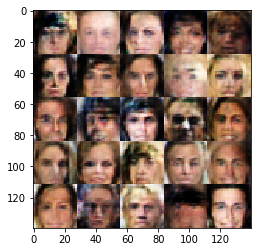

Epoch 1/1... Discriminator Loss: 0.5916... Generator Loss: 2.7879
Epoch 1/1... Discriminator Loss: 0.6267... Generator Loss: 1.4867
Epoch 1/1... Discriminator Loss: 0.6818... Generator Loss: 2.2218
Epoch 1/1... Discriminator Loss: 0.4434... Generator Loss: 2.2822
Epoch 1/1... Discriminator Loss: 0.6513... Generator Loss: 0.8275
Epoch 1/1... Discriminator Loss: 0.6381... Generator Loss: 0.7432
Epoch 1/1... Discriminator Loss: 0.4231... Generator Loss: 2.8878
Epoch 1/1... Discriminator Loss: 0.7786... Generator Loss: 2.4617
Epoch 1/1... Discriminator Loss: 0.8133... Generator Loss: 2.2738
Epoch 1/1... Discriminator Loss: 0.8286... Generator Loss: 1.4080


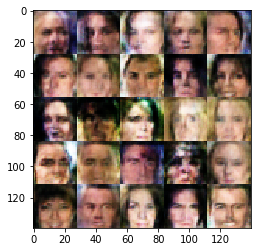

Epoch 1/1... Discriminator Loss: 0.4849... Generator Loss: 2.1320
Epoch 1/1... Discriminator Loss: 0.9039... Generator Loss: 2.1766
Epoch 1/1... Discriminator Loss: 1.1964... Generator Loss: 2.4037
Epoch 1/1... Discriminator Loss: 0.8101... Generator Loss: 1.8271
Epoch 1/1... Discriminator Loss: 1.1067... Generator Loss: 1.1846
Epoch 1/1... Discriminator Loss: 0.8910... Generator Loss: 0.9994
Epoch 1/1... Discriminator Loss: 0.5933... Generator Loss: 1.4111
Epoch 1/1... Discriminator Loss: 1.0884... Generator Loss: 2.6541
Epoch 1/1... Discriminator Loss: 1.1120... Generator Loss: 1.2226
Epoch 1/1... Discriminator Loss: 0.8829... Generator Loss: 1.4615


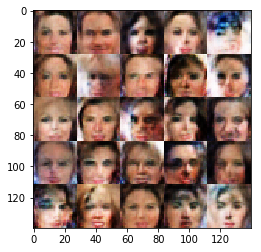

Epoch 1/1... Discriminator Loss: 0.7525... Generator Loss: 2.8577
Epoch 1/1... Discriminator Loss: 0.5107... Generator Loss: 2.9049
Epoch 1/1... Discriminator Loss: 0.4909... Generator Loss: 2.0068
Epoch 1/1... Discriminator Loss: 0.7507... Generator Loss: 1.2772
Epoch 1/1... Discriminator Loss: 1.6445... Generator Loss: 0.5066
Epoch 1/1... Discriminator Loss: 0.6847... Generator Loss: 1.7885
Epoch 1/1... Discriminator Loss: 1.1817... Generator Loss: 1.6581
Epoch 1/1... Discriminator Loss: 0.6415... Generator Loss: 1.1321
Epoch 1/1... Discriminator Loss: 0.6557... Generator Loss: 1.5325
Epoch 1/1... Discriminator Loss: 0.7282... Generator Loss: 0.8601


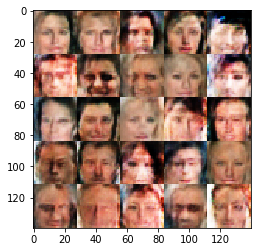

Epoch 1/1... Discriminator Loss: 0.7220... Generator Loss: 1.4665
Epoch 1/1... Discriminator Loss: 0.5142... Generator Loss: 1.6629
Epoch 1/1... Discriminator Loss: 0.7335... Generator Loss: 1.4430
Epoch 1/1... Discriminator Loss: 0.6019... Generator Loss: 2.5906
Epoch 1/1... Discriminator Loss: 0.8338... Generator Loss: 2.2391
Epoch 1/1... Discriminator Loss: 0.5946... Generator Loss: 1.7507
Epoch 1/1... Discriminator Loss: 0.6333... Generator Loss: 2.4054
Epoch 1/1... Discriminator Loss: 1.4029... Generator Loss: 0.9679
Epoch 1/1... Discriminator Loss: 1.2002... Generator Loss: 1.3492
Epoch 1/1... Discriminator Loss: 0.6035... Generator Loss: 2.1404


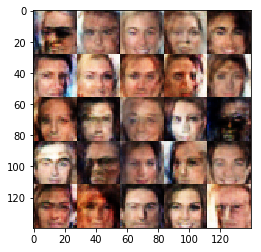

Epoch 1/1... Discriminator Loss: 0.6694... Generator Loss: 2.2750
Epoch 1/1... Discriminator Loss: 0.8586... Generator Loss: 0.9866
Epoch 1/1... Discriminator Loss: 0.8203... Generator Loss: 1.4019
Epoch 1/1... Discriminator Loss: 1.3981... Generator Loss: 1.1098
Epoch 1/1... Discriminator Loss: 0.8540... Generator Loss: 0.8171
Epoch 1/1... Discriminator Loss: 1.1299... Generator Loss: 2.8347
Epoch 1/1... Discriminator Loss: 0.5616... Generator Loss: 2.4847
Epoch 1/1... Discriminator Loss: 0.6676... Generator Loss: 1.6274
Epoch 1/1... Discriminator Loss: 0.9751... Generator Loss: 1.5565
Epoch 1/1... Discriminator Loss: 1.6170... Generator Loss: 3.4415


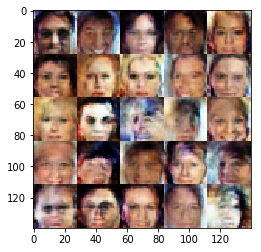

Epoch 1/1... Discriminator Loss: 0.5755... Generator Loss: 1.5834
Epoch 1/1... Discriminator Loss: 0.8049... Generator Loss: 2.9339
Epoch 1/1... Discriminator Loss: 0.6398... Generator Loss: 1.0673
Epoch 1/1... Discriminator Loss: 0.5770... Generator Loss: 1.7470
Epoch 1/1... Discriminator Loss: 0.5067... Generator Loss: 1.6629
Epoch 1/1... Discriminator Loss: 0.7179... Generator Loss: 1.2317
Epoch 1/1... Discriminator Loss: 0.7018... Generator Loss: 1.6619
Epoch 1/1... Discriminator Loss: 0.5403... Generator Loss: 1.8000
Epoch 1/1... Discriminator Loss: 0.5240... Generator Loss: 1.3564
Epoch 1/1... Discriminator Loss: 0.6981... Generator Loss: 1.6886


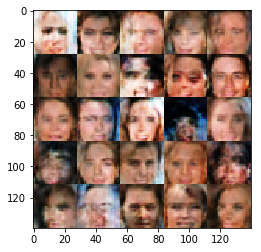

Epoch 1/1... Discriminator Loss: 0.6958... Generator Loss: 1.7945
Epoch 1/1... Discriminator Loss: 1.0923... Generator Loss: 0.5908
Epoch 1/1... Discriminator Loss: 1.0986... Generator Loss: 2.4884
Epoch 1/1... Discriminator Loss: 0.9390... Generator Loss: 2.3368
Epoch 1/1... Discriminator Loss: 0.7271... Generator Loss: 1.4112
Epoch 1/1... Discriminator Loss: 1.1369... Generator Loss: 0.6470
Epoch 1/1... Discriminator Loss: 0.7839... Generator Loss: 2.0154
Epoch 1/1... Discriminator Loss: 0.5469... Generator Loss: 1.7075
Epoch 1/1... Discriminator Loss: 0.7563... Generator Loss: 1.5805
Epoch 1/1... Discriminator Loss: 0.6639... Generator Loss: 1.7051


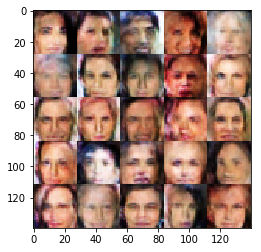

Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 3.1899
Epoch 1/1... Discriminator Loss: 0.9193... Generator Loss: 1.1605
Epoch 1/1... Discriminator Loss: 0.6524... Generator Loss: 2.0773
Epoch 1/1... Discriminator Loss: 1.0426... Generator Loss: 1.8297
Epoch 1/1... Discriminator Loss: 0.5927... Generator Loss: 1.8405
Epoch 1/1... Discriminator Loss: 0.7299... Generator Loss: 1.8164
Epoch 1/1... Discriminator Loss: 0.5427... Generator Loss: 2.1970
Epoch 1/1... Discriminator Loss: 0.6080... Generator Loss: 1.6176
Epoch 1/1... Discriminator Loss: 0.8057... Generator Loss: 1.1956
Epoch 1/1... Discriminator Loss: 0.6262... Generator Loss: 2.5466


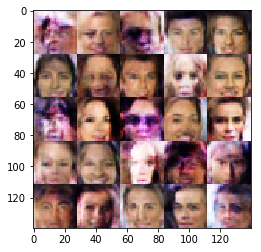

Epoch 1/1... Discriminator Loss: 0.5972... Generator Loss: 2.5964
Epoch 1/1... Discriminator Loss: 0.4111... Generator Loss: 2.2265
Epoch 1/1... Discriminator Loss: 0.6845... Generator Loss: 1.0280
Epoch 1/1... Discriminator Loss: 0.5379... Generator Loss: 2.2007
Epoch 1/1... Discriminator Loss: 0.7021... Generator Loss: 1.1404
Epoch 1/1... Discriminator Loss: 0.9953... Generator Loss: 0.6200
Epoch 1/1... Discriminator Loss: 0.8474... Generator Loss: 0.8170
Epoch 1/1... Discriminator Loss: 0.7935... Generator Loss: 1.9928
Epoch 1/1... Discriminator Loss: 0.8790... Generator Loss: 2.6353
Epoch 1/1... Discriminator Loss: 0.8132... Generator Loss: 0.7279


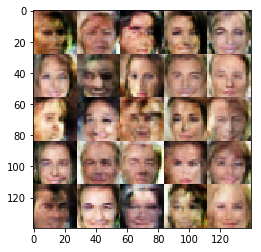

Epoch 1/1... Discriminator Loss: 0.6012... Generator Loss: 1.1585
Epoch 1/1... Discriminator Loss: 0.7908... Generator Loss: 2.1024
Epoch 1/1... Discriminator Loss: 0.5527... Generator Loss: 1.1239
Epoch 1/1... Discriminator Loss: 0.5758... Generator Loss: 1.4786
Epoch 1/1... Discriminator Loss: 1.1697... Generator Loss: 1.7498
Epoch 1/1... Discriminator Loss: 0.8948... Generator Loss: 1.6085
Epoch 1/1... Discriminator Loss: 0.8929... Generator Loss: 0.8913
Epoch 1/1... Discriminator Loss: 0.7331... Generator Loss: 1.7485
Epoch 1/1... Discriminator Loss: 0.6109... Generator Loss: 2.3302
Epoch 1/1... Discriminator Loss: 1.5504... Generator Loss: 3.7814


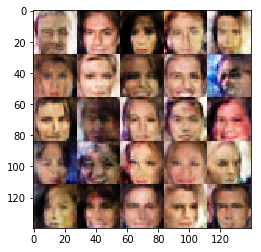

Epoch 1/1... Discriminator Loss: 0.9857... Generator Loss: 1.6437
Epoch 1/1... Discriminator Loss: 0.6343... Generator Loss: 1.8980
Epoch 1/1... Discriminator Loss: 0.4837... Generator Loss: 3.1718
Epoch 1/1... Discriminator Loss: 1.1602... Generator Loss: 1.0745
Epoch 1/1... Discriminator Loss: 1.6526... Generator Loss: 0.7444
Epoch 1/1... Discriminator Loss: 0.5579... Generator Loss: 1.3402
Epoch 1/1... Discriminator Loss: 0.7728... Generator Loss: 2.2097
Epoch 1/1... Discriminator Loss: 0.5092... Generator Loss: 3.4804
Epoch 1/1... Discriminator Loss: 0.6216... Generator Loss: 1.7841
Epoch 1/1... Discriminator Loss: 0.7564... Generator Loss: 0.7279


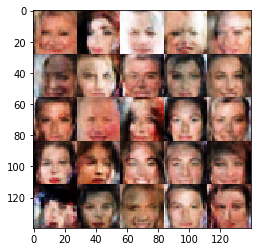

Epoch 1/1... Discriminator Loss: 0.5269... Generator Loss: 2.0025
Epoch 1/1... Discriminator Loss: 0.6327... Generator Loss: 2.4286
Epoch 1/1... Discriminator Loss: 1.5654... Generator Loss: 0.6125
Epoch 1/1... Discriminator Loss: 0.8838... Generator Loss: 0.9500
Epoch 1/1... Discriminator Loss: 0.5508... Generator Loss: 1.7973
Epoch 1/1... Discriminator Loss: 0.6455... Generator Loss: 2.1340
Epoch 1/1... Discriminator Loss: 0.7076... Generator Loss: 1.4266
Epoch 1/1... Discriminator Loss: 0.9654... Generator Loss: 1.8244
Epoch 1/1... Discriminator Loss: 1.2679... Generator Loss: 1.9959
Epoch 1/1... Discriminator Loss: 0.9287... Generator Loss: 1.7074


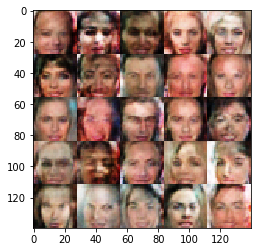

Epoch 1/1... Discriminator Loss: 0.7421... Generator Loss: 2.8414
Epoch 1/1... Discriminator Loss: 0.5664... Generator Loss: 1.2760
Epoch 1/1... Discriminator Loss: 0.9417... Generator Loss: 1.9743
Epoch 1/1... Discriminator Loss: 0.5220... Generator Loss: 2.2195
Epoch 1/1... Discriminator Loss: 0.7153... Generator Loss: 1.1445
Epoch 1/1... Discriminator Loss: 0.4418... Generator Loss: 2.9984
Epoch 1/1... Discriminator Loss: 0.8324... Generator Loss: 1.4286
Epoch 1/1... Discriminator Loss: 0.5608... Generator Loss: 1.6955
Epoch 1/1... Discriminator Loss: 0.7208... Generator Loss: 1.5891
Epoch 1/1... Discriminator Loss: 0.4864... Generator Loss: 1.5769


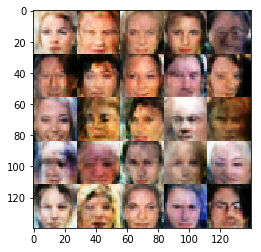

Epoch 1/1... Discriminator Loss: 0.7928... Generator Loss: 1.4229
Epoch 1/1... Discriminator Loss: 0.5967... Generator Loss: 1.9471
Epoch 1/1... Discriminator Loss: 0.8483... Generator Loss: 1.9981
Epoch 1/1... Discriminator Loss: 1.2096... Generator Loss: 0.5000
Epoch 1/1... Discriminator Loss: 0.9019... Generator Loss: 1.7986
Epoch 1/1... Discriminator Loss: 0.4291... Generator Loss: 2.6609
Epoch 1/1... Discriminator Loss: 0.5316... Generator Loss: 2.7715
Epoch 1/1... Discriminator Loss: 0.7394... Generator Loss: 0.9362
Epoch 1/1... Discriminator Loss: 0.5967... Generator Loss: 2.7315
Epoch 1/1... Discriminator Loss: 0.7977... Generator Loss: 1.0918


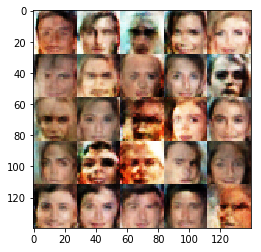

Epoch 1/1... Discriminator Loss: 0.5149... Generator Loss: 2.3119
Epoch 1/1... Discriminator Loss: 0.7218... Generator Loss: 2.3821
Epoch 1/1... Discriminator Loss: 0.9276... Generator Loss: 2.0887
Epoch 1/1... Discriminator Loss: 0.7591... Generator Loss: 1.9278
Epoch 1/1... Discriminator Loss: 0.5797... Generator Loss: 1.6620
Epoch 1/1... Discriminator Loss: 0.6808... Generator Loss: 1.4023
Epoch 1/1... Discriminator Loss: 0.6536... Generator Loss: 1.8309
Epoch 1/1... Discriminator Loss: 0.6142... Generator Loss: 2.2529
Epoch 1/1... Discriminator Loss: 0.6644... Generator Loss: 1.0993
Epoch 1/1... Discriminator Loss: 0.4772... Generator Loss: 2.6644


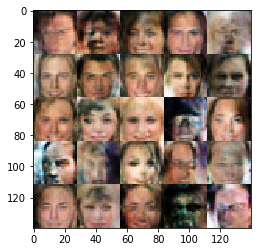

Epoch 1/1... Discriminator Loss: 0.5754... Generator Loss: 1.7405
Epoch 1/1... Discriminator Loss: 0.5392... Generator Loss: 1.0494
Epoch 1/1... Discriminator Loss: 1.0280... Generator Loss: 1.2266
Epoch 1/1... Discriminator Loss: 1.0485... Generator Loss: 1.6087
Epoch 1/1... Discriminator Loss: 0.8076... Generator Loss: 2.0207
Epoch 1/1... Discriminator Loss: 0.8903... Generator Loss: 1.3371
Epoch 1/1... Discriminator Loss: 0.8024... Generator Loss: 1.1763
Epoch 1/1... Discriminator Loss: 0.6003... Generator Loss: 3.2362
Epoch 1/1... Discriminator Loss: 0.8339... Generator Loss: 1.0045
Epoch 1/1... Discriminator Loss: 1.2981... Generator Loss: 3.7019


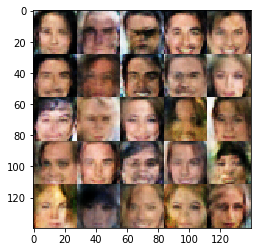

Epoch 1/1... Discriminator Loss: 0.4943... Generator Loss: 1.9228
Epoch 1/1... Discriminator Loss: 0.8018... Generator Loss: 2.0471
Epoch 1/1... Discriminator Loss: 0.4161... Generator Loss: 2.7896
Epoch 1/1... Discriminator Loss: 0.7830... Generator Loss: 1.0402
Epoch 1/1... Discriminator Loss: 0.6188... Generator Loss: 1.0350
Epoch 1/1... Discriminator Loss: 0.5864... Generator Loss: 1.5970
Epoch 1/1... Discriminator Loss: 0.8020... Generator Loss: 1.0388
Epoch 1/1... Discriminator Loss: 0.7193... Generator Loss: 2.9459
Epoch 1/1... Discriminator Loss: 0.4872... Generator Loss: 1.8461
Epoch 1/1... Discriminator Loss: 1.0508... Generator Loss: 2.3750


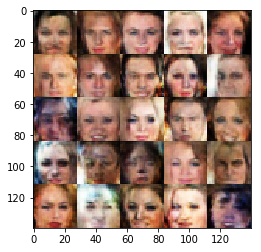

Epoch 1/1... Discriminator Loss: 0.7586... Generator Loss: 1.0850
Epoch 1/1... Discriminator Loss: 1.0544... Generator Loss: 1.9085
Epoch 1/1... Discriminator Loss: 0.4231... Generator Loss: 2.2190
Epoch 1/1... Discriminator Loss: 0.6254... Generator Loss: 2.4649
Epoch 1/1... Discriminator Loss: 0.7054... Generator Loss: 2.5294
Epoch 1/1... Discriminator Loss: 0.5162... Generator Loss: 1.7779
Epoch 1/1... Discriminator Loss: 0.8913... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 0.5425... Generator Loss: 1.1629
Epoch 1/1... Discriminator Loss: 0.6484... Generator Loss: 1.3460
Epoch 1/1... Discriminator Loss: 0.5077... Generator Loss: 2.3526


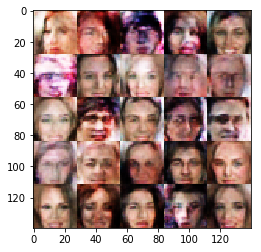

Epoch 1/1... Discriminator Loss: 1.0352... Generator Loss: 1.6900
Epoch 1/1... Discriminator Loss: 0.5138... Generator Loss: 1.3615
Epoch 1/1... Discriminator Loss: 1.0303... Generator Loss: 0.9772
Epoch 1/1... Discriminator Loss: 0.6140... Generator Loss: 1.6088
Epoch 1/1... Discriminator Loss: 1.3214... Generator Loss: 1.4770
Epoch 1/1... Discriminator Loss: 0.5842... Generator Loss: 1.8134
Epoch 1/1... Discriminator Loss: 0.8905... Generator Loss: 1.8679
Epoch 1/1... Discriminator Loss: 0.6094... Generator Loss: 2.5870
Epoch 1/1... Discriminator Loss: 0.7521... Generator Loss: 1.2864
Epoch 1/1... Discriminator Loss: 0.8370... Generator Loss: 2.1377


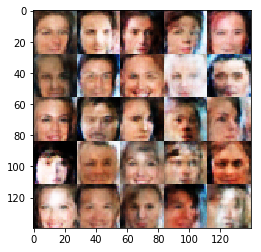

Epoch 1/1... Discriminator Loss: 0.6228... Generator Loss: 1.6951
Epoch 1/1... Discriminator Loss: 0.8897... Generator Loss: 1.4939
Epoch 1/1... Discriminator Loss: 0.6197... Generator Loss: 2.0548
Epoch 1/1... Discriminator Loss: 0.6258... Generator Loss: 1.7688
Epoch 1/1... Discriminator Loss: 0.5514... Generator Loss: 1.4984
Epoch 1/1... Discriminator Loss: 0.6906... Generator Loss: 1.2106
Epoch 1/1... Discriminator Loss: 0.5453... Generator Loss: 1.6906
Epoch 1/1... Discriminator Loss: 0.7052... Generator Loss: 1.6973
Epoch 1/1... Discriminator Loss: 1.1253... Generator Loss: 1.2131
Epoch 1/1... Discriminator Loss: 0.9649... Generator Loss: 1.2587


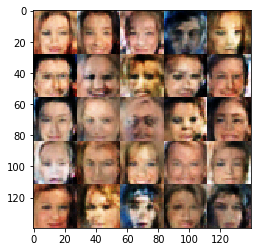

Epoch 1/1... Discriminator Loss: 0.6090... Generator Loss: 1.0325
Epoch 1/1... Discriminator Loss: 0.7568... Generator Loss: 1.8271
Epoch 1/1... Discriminator Loss: 0.5716... Generator Loss: 1.1334
Epoch 1/1... Discriminator Loss: 0.6847... Generator Loss: 0.8420
Epoch 1/1... Discriminator Loss: 0.4399... Generator Loss: 2.6708
Epoch 1/1... Discriminator Loss: 0.7839... Generator Loss: 0.4780
Epoch 1/1... Discriminator Loss: 0.9166... Generator Loss: 1.0322
Epoch 1/1... Discriminator Loss: 0.5532... Generator Loss: 1.5513
Epoch 1/1... Discriminator Loss: 0.8509... Generator Loss: 0.8993
Epoch 1/1... Discriminator Loss: 0.6351... Generator Loss: 1.6695


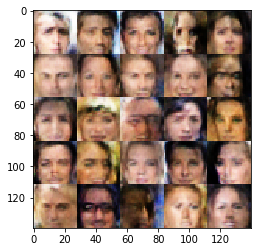

Epoch 1/1... Discriminator Loss: 0.7775... Generator Loss: 1.9462
Epoch 1/1... Discriminator Loss: 0.6146... Generator Loss: 2.7328
Epoch 1/1... Discriminator Loss: 0.4752... Generator Loss: 2.5946
Epoch 1/1... Discriminator Loss: 0.8401... Generator Loss: 1.3355
Epoch 1/1... Discriminator Loss: 1.3536... Generator Loss: 2.0214
Epoch 1/1... Discriminator Loss: 0.3899... Generator Loss: 3.1134
Epoch 1/1... Discriminator Loss: 0.6380... Generator Loss: 1.9150
Epoch 1/1... Discriminator Loss: 0.6435... Generator Loss: 1.3875
Epoch 1/1... Discriminator Loss: 0.6979... Generator Loss: 1.6696
Epoch 1/1... Discriminator Loss: 1.1237... Generator Loss: 0.9584


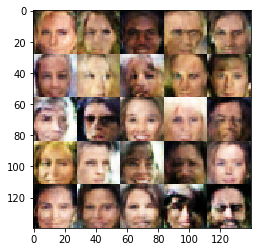

Epoch 1/1... Discriminator Loss: 1.0101... Generator Loss: 1.4792
Epoch 1/1... Discriminator Loss: 0.4709... Generator Loss: 1.2733
Epoch 1/1... Discriminator Loss: 0.7689... Generator Loss: 1.0443
Epoch 1/1... Discriminator Loss: 1.2301... Generator Loss: 2.6373
Epoch 1/1... Discriminator Loss: 0.6606... Generator Loss: 1.2754
Epoch 1/1... Discriminator Loss: 1.1511... Generator Loss: 1.1839
Epoch 1/1... Discriminator Loss: 0.5629... Generator Loss: 2.0432
Epoch 1/1... Discriminator Loss: 0.8237... Generator Loss: 1.3841
Epoch 1/1... Discriminator Loss: 0.4990... Generator Loss: 1.1143
Epoch 1/1... Discriminator Loss: 0.4842... Generator Loss: 2.1101


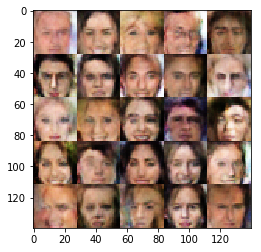

Epoch 1/1... Discriminator Loss: 0.7045... Generator Loss: 1.3617
Epoch 1/1... Discriminator Loss: 0.5378... Generator Loss: 2.7795
Epoch 1/1... Discriminator Loss: 0.9203... Generator Loss: 1.5345
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.7121
Epoch 1/1... Discriminator Loss: 0.6320... Generator Loss: 2.3433
Epoch 1/1... Discriminator Loss: 0.9358... Generator Loss: 2.4533
Epoch 1/1... Discriminator Loss: 0.5179... Generator Loss: 1.8665
Epoch 1/1... Discriminator Loss: 0.9448... Generator Loss: 1.1158
Epoch 1/1... Discriminator Loss: 0.5505... Generator Loss: 2.4629
Epoch 1/1... Discriminator Loss: 0.7612... Generator Loss: 1.3777


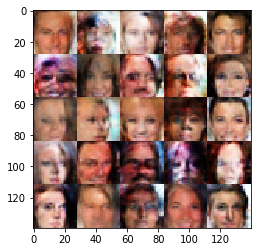

Epoch 1/1... Discriminator Loss: 0.7000... Generator Loss: 2.1985
Epoch 1/1... Discriminator Loss: 0.6492... Generator Loss: 1.2110
Epoch 1/1... Discriminator Loss: 0.6059... Generator Loss: 1.0574
Epoch 1/1... Discriminator Loss: 0.6583... Generator Loss: 2.7237
Epoch 1/1... Discriminator Loss: 0.6031... Generator Loss: 1.3977
Epoch 1/1... Discriminator Loss: 0.7061... Generator Loss: 1.4035
Epoch 1/1... Discriminator Loss: 0.8766... Generator Loss: 2.3623
Epoch 1/1... Discriminator Loss: 0.6044... Generator Loss: 1.9583
Epoch 1/1... Discriminator Loss: 0.6302... Generator Loss: 0.5726
Epoch 1/1... Discriminator Loss: 0.7483... Generator Loss: 1.9008


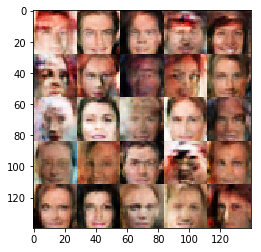

Epoch 1/1... Discriminator Loss: 0.8077... Generator Loss: 1.5374
Epoch 1/1... Discriminator Loss: 0.5990... Generator Loss: 2.9692
Epoch 1/1... Discriminator Loss: 0.3907... Generator Loss: 2.2799
Epoch 1/1... Discriminator Loss: 1.0978... Generator Loss: 2.3926
Epoch 1/1... Discriminator Loss: 0.4842... Generator Loss: 2.5725
Epoch 1/1... Discriminator Loss: 0.8884... Generator Loss: 1.1037
Epoch 1/1... Discriminator Loss: 1.6582... Generator Loss: 2.1941
Epoch 1/1... Discriminator Loss: 0.7854... Generator Loss: 0.9392
Epoch 1/1... Discriminator Loss: 1.2564... Generator Loss: 1.1327
Epoch 1/1... Discriminator Loss: 0.4566... Generator Loss: 2.6951


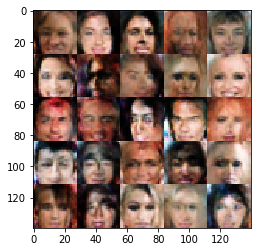

Epoch 1/1... Discriminator Loss: 0.6779... Generator Loss: 2.4664
Epoch 1/1... Discriminator Loss: 0.4790... Generator Loss: 2.1147
Epoch 1/1... Discriminator Loss: 1.1325... Generator Loss: 2.8004
Epoch 1/1... Discriminator Loss: 0.6920... Generator Loss: 2.4028
Epoch 1/1... Discriminator Loss: 0.9515... Generator Loss: 2.7867
Epoch 1/1... Discriminator Loss: 0.8827... Generator Loss: 1.6826
Epoch 1/1... Discriminator Loss: 0.6117... Generator Loss: 2.4646
Epoch 1/1... Discriminator Loss: 0.7701... Generator Loss: 1.3780
Epoch 1/1... Discriminator Loss: 0.6007... Generator Loss: 2.2744
Epoch 1/1... Discriminator Loss: 0.7606... Generator Loss: 1.6136


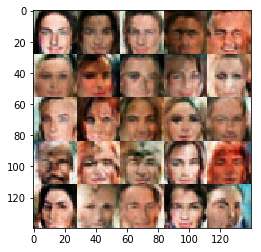

Epoch 1/1... Discriminator Loss: 0.8264... Generator Loss: 0.9366
Epoch 1/1... Discriminator Loss: 1.0206... Generator Loss: 0.6982
Epoch 1/1... Discriminator Loss: 0.6952... Generator Loss: 3.1600
Epoch 1/1... Discriminator Loss: 1.0981... Generator Loss: 0.4771
Epoch 1/1... Discriminator Loss: 0.5462... Generator Loss: 3.1865
Epoch 1/1... Discriminator Loss: 1.8185... Generator Loss: 0.8882
Epoch 1/1... Discriminator Loss: 1.0595... Generator Loss: 0.9608
Epoch 1/1... Discriminator Loss: 0.3911... Generator Loss: 1.6234
Epoch 1/1... Discriminator Loss: 0.8032... Generator Loss: 3.0946
Epoch 1/1... Discriminator Loss: 0.7499... Generator Loss: 2.6979


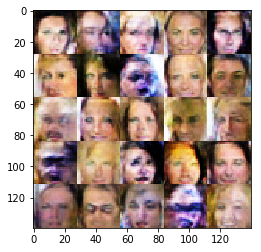

Epoch 1/1... Discriminator Loss: 0.9569... Generator Loss: 2.9689
Epoch 1/1... Discriminator Loss: 0.5842... Generator Loss: 2.0605
Epoch 1/1... Discriminator Loss: 1.0847... Generator Loss: 1.2560
Epoch 1/1... Discriminator Loss: 0.4991... Generator Loss: 1.9198
Epoch 1/1... Discriminator Loss: 0.7816... Generator Loss: 1.7494
Epoch 1/1... Discriminator Loss: 0.5778... Generator Loss: 1.4446
Epoch 1/1... Discriminator Loss: 0.6168... Generator Loss: 1.7714
Epoch 1/1... Discriminator Loss: 0.7149... Generator Loss: 0.9698
Epoch 1/1... Discriminator Loss: 0.8114... Generator Loss: 2.2943
Epoch 1/1... Discriminator Loss: 0.9385... Generator Loss: 0.8242


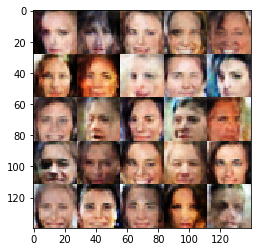

Epoch 1/1... Discriminator Loss: 0.5145... Generator Loss: 0.5447
Epoch 1/1... Discriminator Loss: 0.8485... Generator Loss: 1.5982
Epoch 1/1... Discriminator Loss: 0.6447... Generator Loss: 2.4137
Epoch 1/1... Discriminator Loss: 0.5208... Generator Loss: 1.5739
Epoch 1/1... Discriminator Loss: 0.7014... Generator Loss: 2.1331
Epoch 1/1... Discriminator Loss: 0.7192... Generator Loss: 2.0147
Epoch 1/1... Discriminator Loss: 0.4766... Generator Loss: 1.5172
Epoch 1/1... Discriminator Loss: 0.5981... Generator Loss: 2.9443
Epoch 1/1... Discriminator Loss: 1.3269... Generator Loss: 0.9428
Epoch 1/1... Discriminator Loss: 0.5029... Generator Loss: 1.7894


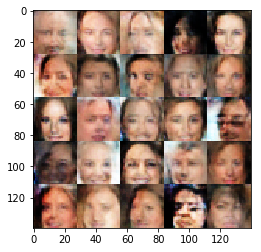

Epoch 1/1... Discriminator Loss: 0.5856... Generator Loss: 2.8150
Epoch 1/1... Discriminator Loss: 0.9598... Generator Loss: 1.4185
Epoch 1/1... Discriminator Loss: 0.9636... Generator Loss: 1.0397
Epoch 1/1... Discriminator Loss: 0.6100... Generator Loss: 1.8298
Epoch 1/1... Discriminator Loss: 0.5260... Generator Loss: 1.9082
Epoch 1/1... Discriminator Loss: 0.9913... Generator Loss: 3.3206
Epoch 1/1... Discriminator Loss: 0.6743... Generator Loss: 2.8400
Epoch 1/1... Discriminator Loss: 0.6040... Generator Loss: 3.2890
Epoch 1/1... Discriminator Loss: 1.0861... Generator Loss: 1.7277
Epoch 1/1... Discriminator Loss: 0.5768... Generator Loss: 2.0970


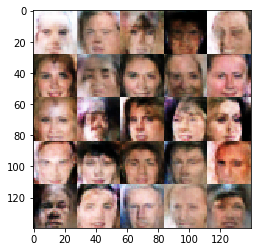

Epoch 1/1... Discriminator Loss: 0.8167... Generator Loss: 2.3132
Epoch 1/1... Discriminator Loss: 0.4545... Generator Loss: 2.5610
Epoch 1/1... Discriminator Loss: 0.6170... Generator Loss: 1.3552
Epoch 1/1... Discriminator Loss: 0.5954... Generator Loss: 2.2781
Epoch 1/1... Discriminator Loss: 0.5584... Generator Loss: 2.0326
Epoch 1/1... Discriminator Loss: 0.6431... Generator Loss: 1.7607
Epoch 1/1... Discriminator Loss: 0.5697... Generator Loss: 1.3511
Epoch 1/1... Discriminator Loss: 0.9383... Generator Loss: 1.9892
Epoch 1/1... Discriminator Loss: 1.0308... Generator Loss: 1.1039
Epoch 1/1... Discriminator Loss: 1.0237... Generator Loss: 1.6382


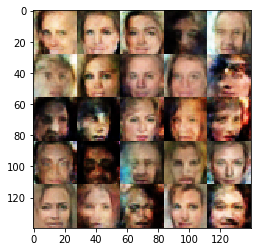

Epoch 1/1... Discriminator Loss: 1.0851... Generator Loss: 1.0575
Epoch 1/1... Discriminator Loss: 0.8238... Generator Loss: 0.7012
Epoch 1/1... Discriminator Loss: 0.4387... Generator Loss: 2.0841
Epoch 1/1... Discriminator Loss: 1.4714... Generator Loss: 2.1543
Epoch 1/1... Discriminator Loss: 0.5851... Generator Loss: 1.4952
Epoch 1/1... Discriminator Loss: 0.7020... Generator Loss: 1.9225
Epoch 1/1... Discriminator Loss: 0.7189... Generator Loss: 2.0276
Epoch 1/1... Discriminator Loss: 0.4354... Generator Loss: 1.6868
Epoch 1/1... Discriminator Loss: 0.7812... Generator Loss: 1.4145
Epoch 1/1... Discriminator Loss: 0.3939... Generator Loss: 1.8318


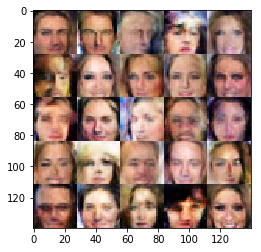

Epoch 1/1... Discriminator Loss: 0.4127... Generator Loss: 1.8658
Epoch 1/1... Discriminator Loss: 0.4815... Generator Loss: 2.2634
Epoch 1/1... Discriminator Loss: 0.5184... Generator Loss: 3.1312
Epoch 1/1... Discriminator Loss: 0.5248... Generator Loss: 1.9669
Epoch 1/1... Discriminator Loss: 0.5185... Generator Loss: 2.4716
Epoch 1/1... Discriminator Loss: 0.6888... Generator Loss: 1.7121
Epoch 1/1... Discriminator Loss: 0.5783... Generator Loss: 1.7155
Epoch 1/1... Discriminator Loss: 0.4703... Generator Loss: 2.7239
Epoch 1/1... Discriminator Loss: 0.7544... Generator Loss: 1.9694
Epoch 1/1... Discriminator Loss: 1.5138... Generator Loss: 1.2150


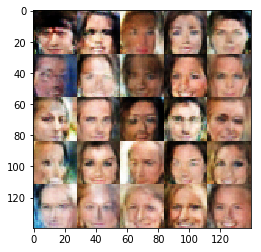

Epoch 1/1... Discriminator Loss: 1.1476... Generator Loss: 0.8157
Epoch 1/1... Discriminator Loss: 0.5870... Generator Loss: 2.5941
Epoch 1/1... Discriminator Loss: 0.6253... Generator Loss: 2.6263
Epoch 1/1... Discriminator Loss: 0.7063... Generator Loss: 2.2080
Epoch 1/1... Discriminator Loss: 0.6502... Generator Loss: 1.3511
Epoch 1/1... Discriminator Loss: 0.6259... Generator Loss: 1.3315
Epoch 1/1... Discriminator Loss: 0.5608... Generator Loss: 1.4880
Epoch 1/1... Discriminator Loss: 1.0172... Generator Loss: 1.5715
Epoch 1/1... Discriminator Loss: 0.7553... Generator Loss: 1.5111
Epoch 1/1... Discriminator Loss: 0.7910... Generator Loss: 1.5888


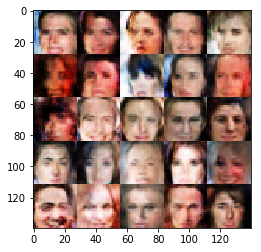

Epoch 1/1... Discriminator Loss: 0.5990... Generator Loss: 1.1031
Epoch 1/1... Discriminator Loss: 0.6979... Generator Loss: 1.0329
Epoch 1/1... Discriminator Loss: 0.4613... Generator Loss: 2.6052
Epoch 1/1... Discriminator Loss: 0.8401... Generator Loss: 1.9042
Epoch 1/1... Discriminator Loss: 0.6689... Generator Loss: 1.8381
Epoch 1/1... Discriminator Loss: 0.8375... Generator Loss: 1.2354
Epoch 1/1... Discriminator Loss: 0.7740... Generator Loss: 2.2679
Epoch 1/1... Discriminator Loss: 0.6490... Generator Loss: 1.0905
Epoch 1/1... Discriminator Loss: 0.9240... Generator Loss: 1.1905
Epoch 1/1... Discriminator Loss: 0.4440... Generator Loss: 2.4764


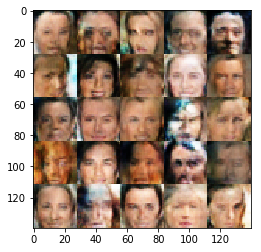

Epoch 1/1... Discriminator Loss: 0.5738... Generator Loss: 2.6156
Epoch 1/1... Discriminator Loss: 0.8553... Generator Loss: 2.4840
Epoch 1/1... Discriminator Loss: 0.5167... Generator Loss: 1.7831
Epoch 1/1... Discriminator Loss: 0.5343... Generator Loss: 3.4366
Epoch 1/1... Discriminator Loss: 0.5130... Generator Loss: 2.6687
Epoch 1/1... Discriminator Loss: 0.6111... Generator Loss: 1.7915
Epoch 1/1... Discriminator Loss: 0.5914... Generator Loss: 1.6096
Epoch 1/1... Discriminator Loss: 0.6369... Generator Loss: 2.4088
Epoch 1/1... Discriminator Loss: 0.4167... Generator Loss: 2.6195
Epoch 1/1... Discriminator Loss: 0.6473... Generator Loss: 1.4367


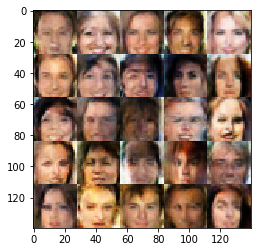

Epoch 1/1... Discriminator Loss: 0.8509... Generator Loss: 2.0298
Epoch 1/1... Discriminator Loss: 0.7794... Generator Loss: 2.1760
Epoch 1/1... Discriminator Loss: 0.5530... Generator Loss: 1.4948
Epoch 1/1... Discriminator Loss: 0.6350... Generator Loss: 2.0854
Epoch 1/1... Discriminator Loss: 0.4135... Generator Loss: 2.4204
Epoch 1/1... Discriminator Loss: 0.9578... Generator Loss: 1.4750
Epoch 1/1... Discriminator Loss: 0.5963... Generator Loss: 1.9177
Epoch 1/1... Discriminator Loss: 0.7791... Generator Loss: 1.2798
Epoch 1/1... Discriminator Loss: 0.5678... Generator Loss: 1.3612
Epoch 1/1... Discriminator Loss: 0.4685... Generator Loss: 2.2825


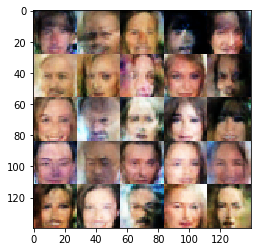

Epoch 1/1... Discriminator Loss: 0.6240... Generator Loss: 2.4763
Epoch 1/1... Discriminator Loss: 0.4813... Generator Loss: 2.2873
Epoch 1/1... Discriminator Loss: 0.9112... Generator Loss: 2.3653
Epoch 1/1... Discriminator Loss: 0.6163... Generator Loss: 2.1530
Epoch 1/1... Discriminator Loss: 0.6720... Generator Loss: 2.2527
Epoch 1/1... Discriminator Loss: 1.0007... Generator Loss: 2.1926
Epoch 1/1... Discriminator Loss: 1.6901... Generator Loss: 1.2584
Epoch 1/1... Discriminator Loss: 0.7103... Generator Loss: 2.4164
Epoch 1/1... Discriminator Loss: 0.6308... Generator Loss: 2.0589
Epoch 1/1... Discriminator Loss: 0.6884... Generator Loss: 1.5356


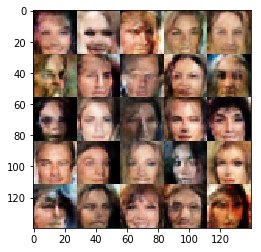

Epoch 1/1... Discriminator Loss: 0.7632... Generator Loss: 1.0473
Epoch 1/1... Discriminator Loss: 0.4226... Generator Loss: 2.4637
Epoch 1/1... Discriminator Loss: 0.5599... Generator Loss: 2.5894
Epoch 1/1... Discriminator Loss: 0.4619... Generator Loss: 2.2548
Epoch 1/1... Discriminator Loss: 0.6184... Generator Loss: 1.9009
Epoch 1/1... Discriminator Loss: 0.6093... Generator Loss: 1.1223
Epoch 1/1... Discriminator Loss: 0.6475... Generator Loss: 1.8298
Epoch 1/1... Discriminator Loss: 0.5536... Generator Loss: 1.6672
Epoch 1/1... Discriminator Loss: 0.7978... Generator Loss: 1.7190
Epoch 1/1... Discriminator Loss: 1.0262... Generator Loss: 1.7944


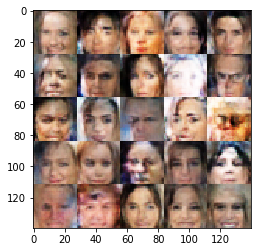

Epoch 1/1... Discriminator Loss: 0.4756... Generator Loss: 3.5017
Epoch 1/1... Discriminator Loss: 0.7594... Generator Loss: 0.9173
Epoch 1/1... Discriminator Loss: 0.6550... Generator Loss: 1.2580
Epoch 1/1... Discriminator Loss: 0.6158... Generator Loss: 2.4748
Epoch 1/1... Discriminator Loss: 0.8403... Generator Loss: 2.7084
Epoch 1/1... Discriminator Loss: 0.8227... Generator Loss: 2.0473
Epoch 1/1... Discriminator Loss: 0.5967... Generator Loss: 1.2245
Epoch 1/1... Discriminator Loss: 0.6727... Generator Loss: 1.6691
Epoch 1/1... Discriminator Loss: 1.0777... Generator Loss: 1.5678
Epoch 1/1... Discriminator Loss: 0.7335... Generator Loss: 1.4843


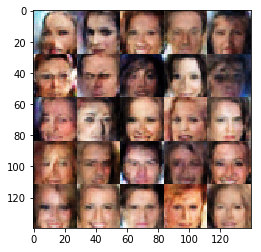

Epoch 1/1... Discriminator Loss: 0.4824... Generator Loss: 1.6484
Epoch 1/1... Discriminator Loss: 0.8003... Generator Loss: 1.0475
Epoch 1/1... Discriminator Loss: 0.8515... Generator Loss: 0.9095
Epoch 1/1... Discriminator Loss: 0.6290... Generator Loss: 0.8337
Epoch 1/1... Discriminator Loss: 0.3958... Generator Loss: 3.1004
Epoch 1/1... Discriminator Loss: 0.7252... Generator Loss: 2.8499
Epoch 1/1... Discriminator Loss: 0.6349... Generator Loss: 2.6261
Epoch 1/1... Discriminator Loss: 0.7654... Generator Loss: 1.4324
Epoch 1/1... Discriminator Loss: 0.5834... Generator Loss: 1.6531
Epoch 1/1... Discriminator Loss: 0.7899... Generator Loss: 1.8072


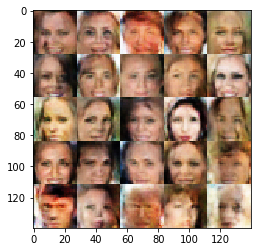

Epoch 1/1... Discriminator Loss: 0.8640... Generator Loss: 0.7629
Epoch 1/1... Discriminator Loss: 0.7433... Generator Loss: 1.2942
Epoch 1/1... Discriminator Loss: 0.5311... Generator Loss: 2.8731
Epoch 1/1... Discriminator Loss: 0.5863... Generator Loss: 2.4914
Epoch 1/1... Discriminator Loss: 0.6001... Generator Loss: 1.4556
Epoch 1/1... Discriminator Loss: 0.6597... Generator Loss: 1.6030
Epoch 1/1... Discriminator Loss: 0.5446... Generator Loss: 1.6212
Epoch 1/1... Discriminator Loss: 0.4308... Generator Loss: 2.3162
Epoch 1/1... Discriminator Loss: 0.5485... Generator Loss: 1.6996
Epoch 1/1... Discriminator Loss: 0.7616... Generator Loss: 1.4813


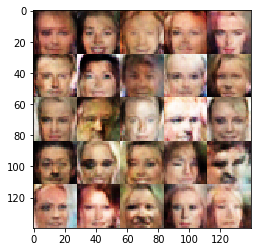

Epoch 1/1... Discriminator Loss: 0.4996... Generator Loss: 1.8163
Epoch 1/1... Discriminator Loss: 0.4517... Generator Loss: 1.3933
Epoch 1/1... Discriminator Loss: 0.4605... Generator Loss: 2.8408
Epoch 1/1... Discriminator Loss: 0.9158... Generator Loss: 2.0128
Epoch 1/1... Discriminator Loss: 0.8373... Generator Loss: 1.4707
Epoch 1/1... Discriminator Loss: 0.7808... Generator Loss: 2.5597
Epoch 1/1... Discriminator Loss: 0.7060... Generator Loss: 1.2401
Epoch 1/1... Discriminator Loss: 0.7719... Generator Loss: 2.4086
Epoch 1/1... Discriminator Loss: 0.7202... Generator Loss: 3.0610
Epoch 1/1... Discriminator Loss: 0.4202... Generator Loss: 3.1064


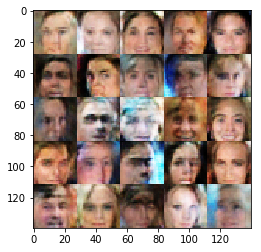

Epoch 1/1... Discriminator Loss: 0.9706... Generator Loss: 1.7698
Epoch 1/1... Discriminator Loss: 1.4325... Generator Loss: 1.2919
Epoch 1/1... Discriminator Loss: 0.6228... Generator Loss: 4.2218
Epoch 1/1... Discriminator Loss: 0.6266... Generator Loss: 1.3826
Epoch 1/1... Discriminator Loss: 0.5371... Generator Loss: 1.3870
Epoch 1/1... Discriminator Loss: 0.6616... Generator Loss: 1.0131
Epoch 1/1... Discriminator Loss: 0.7265... Generator Loss: 1.5531
Epoch 1/1... Discriminator Loss: 0.6110... Generator Loss: 2.3466
Epoch 1/1... Discriminator Loss: 0.7924... Generator Loss: 2.3468
Epoch 1/1... Discriminator Loss: 0.6970... Generator Loss: 1.4924


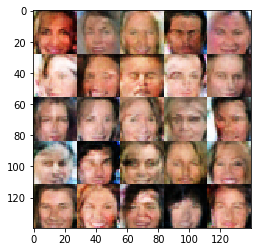

Epoch 1/1... Discriminator Loss: 1.3085... Generator Loss: 0.8815
Epoch 1/1... Discriminator Loss: 0.7004... Generator Loss: 2.3954
Epoch 1/1... Discriminator Loss: 0.9124... Generator Loss: 1.1844
Epoch 1/1... Discriminator Loss: 0.6452... Generator Loss: 1.9444
Epoch 1/1... Discriminator Loss: 0.4698... Generator Loss: 3.3194
Epoch 1/1... Discriminator Loss: 0.6352... Generator Loss: 2.4893
Epoch 1/1... Discriminator Loss: 0.7381... Generator Loss: 1.0344
Epoch 1/1... Discriminator Loss: 0.7450... Generator Loss: 2.8846
Epoch 1/1... Discriminator Loss: 0.5661... Generator Loss: 2.4144
Epoch 1/1... Discriminator Loss: 0.7045... Generator Loss: 3.2956


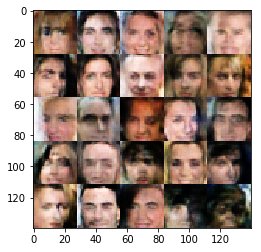

Epoch 1/1... Discriminator Loss: 0.9544... Generator Loss: 0.7308
Epoch 1/1... Discriminator Loss: 0.9738... Generator Loss: 1.1082
Epoch 1/1... Discriminator Loss: 0.6229... Generator Loss: 2.2935
Epoch 1/1... Discriminator Loss: 0.6626... Generator Loss: 1.9864
Epoch 1/1... Discriminator Loss: 0.8621... Generator Loss: 1.2478
Epoch 1/1... Discriminator Loss: 0.4581... Generator Loss: 1.2893
Epoch 1/1... Discriminator Loss: 0.4348... Generator Loss: 3.3093
Epoch 1/1... Discriminator Loss: 0.7121... Generator Loss: 3.3423
Epoch 1/1... Discriminator Loss: 0.8107... Generator Loss: 0.5905
Epoch 1/1... Discriminator Loss: 0.8049... Generator Loss: 2.1564


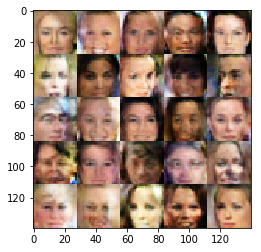

Epoch 1/1... Discriminator Loss: 1.0920... Generator Loss: 1.3190
Epoch 1/1... Discriminator Loss: 1.0849... Generator Loss: 2.6283
Epoch 1/1... Discriminator Loss: 0.4912... Generator Loss: 1.3326
Epoch 1/1... Discriminator Loss: 0.5295... Generator Loss: 1.2459
Epoch 1/1... Discriminator Loss: 0.4486... Generator Loss: 2.0172
Epoch 1/1... Discriminator Loss: 0.7375... Generator Loss: 1.6206
Epoch 1/1... Discriminator Loss: 0.6208... Generator Loss: 1.0920
Epoch 1/1... Discriminator Loss: 0.6302... Generator Loss: 2.4058
Epoch 1/1... Discriminator Loss: 0.4795... Generator Loss: 2.1014
Epoch 1/1... Discriminator Loss: 0.8107... Generator Loss: 2.6032


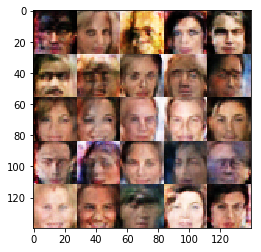

Epoch 1/1... Discriminator Loss: 1.0523... Generator Loss: 1.0270
Epoch 1/1... Discriminator Loss: 0.6588... Generator Loss: 2.7944
Epoch 1/1... Discriminator Loss: 0.5219... Generator Loss: 2.7472
Epoch 1/1... Discriminator Loss: 0.6028... Generator Loss: 1.8148
Epoch 1/1... Discriminator Loss: 0.8228... Generator Loss: 1.7920
Epoch 1/1... Discriminator Loss: 0.5370... Generator Loss: 1.7425
Epoch 1/1... Discriminator Loss: 0.4463... Generator Loss: 3.6353
Epoch 1/1... Discriminator Loss: 0.6086... Generator Loss: 1.1644
Epoch 1/1... Discriminator Loss: 0.4999... Generator Loss: 3.4489
Epoch 1/1... Discriminator Loss: 0.5683... Generator Loss: 2.6699


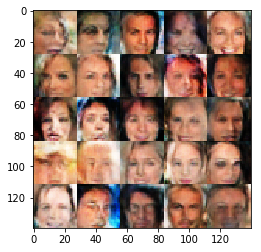

Epoch 1/1... Discriminator Loss: 1.2165... Generator Loss: 1.4682
Epoch 1/1... Discriminator Loss: 1.2018... Generator Loss: 0.4064
Epoch 1/1... Discriminator Loss: 0.4562... Generator Loss: 1.7175
Epoch 1/1... Discriminator Loss: 0.5411... Generator Loss: 2.4918
Epoch 1/1... Discriminator Loss: 0.5794... Generator Loss: 1.9664
Epoch 1/1... Discriminator Loss: 0.8052... Generator Loss: 1.5185
Epoch 1/1... Discriminator Loss: 0.7840... Generator Loss: 1.8184
Epoch 1/1... Discriminator Loss: 0.5528... Generator Loss: 1.6993
Epoch 1/1... Discriminator Loss: 0.4845... Generator Loss: 2.3494
Epoch 1/1... Discriminator Loss: 0.8296... Generator Loss: 2.6063


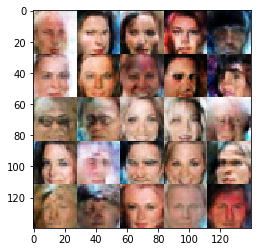

Epoch 1/1... Discriminator Loss: 0.7453... Generator Loss: 2.2060
Epoch 1/1... Discriminator Loss: 0.9814... Generator Loss: 1.6212
Epoch 1/1... Discriminator Loss: 1.0771... Generator Loss: 2.2450
Epoch 1/1... Discriminator Loss: 0.9621... Generator Loss: 2.5689
Epoch 1/1... Discriminator Loss: 0.7131... Generator Loss: 1.9569
Epoch 1/1... Discriminator Loss: 0.8539... Generator Loss: 1.8393
Epoch 1/1... Discriminator Loss: 1.1904... Generator Loss: 0.9861
Epoch 1/1... Discriminator Loss: 0.5289... Generator Loss: 1.5937
Epoch 1/1... Discriminator Loss: 0.5465... Generator Loss: 2.6882
Epoch 1/1... Discriminator Loss: 0.6744... Generator Loss: 1.9592


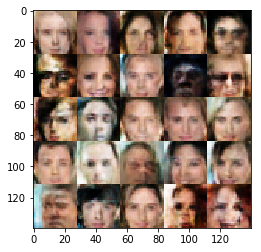

Epoch 1/1... Discriminator Loss: 0.5106... Generator Loss: 1.1657
Epoch 1/1... Discriminator Loss: 0.7885... Generator Loss: 1.5747
Epoch 1/1... Discriminator Loss: 0.6801... Generator Loss: 1.2870
Epoch 1/1... Discriminator Loss: 0.7587... Generator Loss: 2.9120
Epoch 1/1... Discriminator Loss: 0.6814... Generator Loss: 2.1439
Epoch 1/1... Discriminator Loss: 0.7582... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 0.5445... Generator Loss: 0.6954
Epoch 1/1... Discriminator Loss: 0.6320... Generator Loss: 1.2721
Epoch 1/1... Discriminator Loss: 0.5339... Generator Loss: 1.0547
Epoch 1/1... Discriminator Loss: 0.6483... Generator Loss: 1.3375


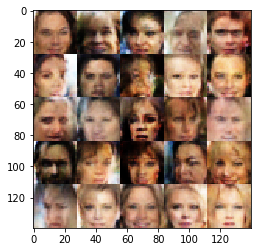

Epoch 1/1... Discriminator Loss: 1.1951... Generator Loss: 1.9028
Epoch 1/1... Discriminator Loss: 0.5023... Generator Loss: 2.1557
Epoch 1/1... Discriminator Loss: 0.7297... Generator Loss: 2.1693
Epoch 1/1... Discriminator Loss: 0.8115... Generator Loss: 1.9515
Epoch 1/1... Discriminator Loss: 0.5069... Generator Loss: 2.9223
Epoch 1/1... Discriminator Loss: 0.7547... Generator Loss: 1.3103
Epoch 1/1... Discriminator Loss: 0.5707... Generator Loss: 2.1326
Epoch 1/1... Discriminator Loss: 0.8292... Generator Loss: 1.0592
Epoch 1/1... Discriminator Loss: 0.6641... Generator Loss: 2.1907
Epoch 1/1... Discriminator Loss: 0.5225... Generator Loss: 3.3793


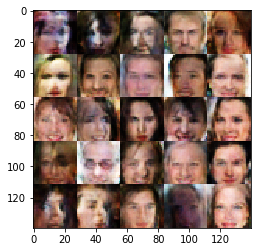

Epoch 1/1... Discriminator Loss: 0.8642... Generator Loss: 1.0299
Epoch 1/1... Discriminator Loss: 1.5218... Generator Loss: 0.5635
Epoch 1/1... Discriminator Loss: 1.1984... Generator Loss: 1.0561
Epoch 1/1... Discriminator Loss: 1.0023... Generator Loss: 2.3413
Epoch 1/1... Discriminator Loss: 0.9139... Generator Loss: 0.7677
Epoch 1/1... Discriminator Loss: 0.6686... Generator Loss: 1.9810
Epoch 1/1... Discriminator Loss: 0.6947... Generator Loss: 1.4109
Epoch 1/1... Discriminator Loss: 0.8343... Generator Loss: 1.7897
Epoch 1/1... Discriminator Loss: 0.4483... Generator Loss: 1.6597
Epoch 1/1... Discriminator Loss: 1.3287... Generator Loss: 2.0617


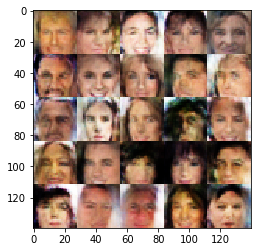

Epoch 1/1... Discriminator Loss: 0.5306... Generator Loss: 2.2682
Epoch 1/1... Discriminator Loss: 0.6364... Generator Loss: 3.8896
Epoch 1/1... Discriminator Loss: 0.6214... Generator Loss: 1.4364
Epoch 1/1... Discriminator Loss: 0.6163... Generator Loss: 1.3981
Epoch 1/1... Discriminator Loss: 0.5118... Generator Loss: 2.0067
Epoch 1/1... Discriminator Loss: 1.0963... Generator Loss: 1.6806
Epoch 1/1... Discriminator Loss: 0.8810... Generator Loss: 2.1604
Epoch 1/1... Discriminator Loss: 0.8795... Generator Loss: 1.3171
Epoch 1/1... Discriminator Loss: 0.5522... Generator Loss: 1.8406
Epoch 1/1... Discriminator Loss: 0.7095... Generator Loss: 0.5920


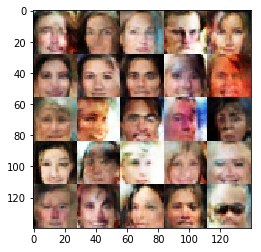

Epoch 1/1... Discriminator Loss: 0.7817... Generator Loss: 1.0328
Epoch 1/1... Discriminator Loss: 0.7371... Generator Loss: 2.7172
Epoch 1/1... Discriminator Loss: 0.6584... Generator Loss: 2.5172
Epoch 1/1... Discriminator Loss: 0.6172... Generator Loss: 2.7928
Epoch 1/1... Discriminator Loss: 0.8401... Generator Loss: 1.1884
Epoch 1/1... Discriminator Loss: 0.7200... Generator Loss: 1.1757
Epoch 1/1... Discriminator Loss: 0.4546... Generator Loss: 2.5819
Epoch 1/1... Discriminator Loss: 0.8687... Generator Loss: 1.3585
Epoch 1/1... Discriminator Loss: 0.6803... Generator Loss: 1.6961
Epoch 1/1... Discriminator Loss: 0.5341... Generator Loss: 2.9148


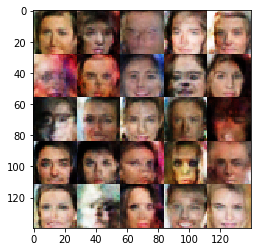

Epoch 1/1... Discriminator Loss: 0.4159... Generator Loss: 2.3692
Epoch 1/1... Discriminator Loss: 0.4180... Generator Loss: 2.7645
Epoch 1/1... Discriminator Loss: 0.6593... Generator Loss: 1.7232
Epoch 1/1... Discriminator Loss: 1.0040... Generator Loss: 1.5426
Epoch 1/1... Discriminator Loss: 1.2711... Generator Loss: 4.2062
Epoch 1/1... Discriminator Loss: 0.6868... Generator Loss: 2.1004
Epoch 1/1... Discriminator Loss: 0.7398... Generator Loss: 1.4367
Epoch 1/1... Discriminator Loss: 1.1138... Generator Loss: 1.0633
Epoch 1/1... Discriminator Loss: 0.7170... Generator Loss: 1.7443
Epoch 1/1... Discriminator Loss: 0.9276... Generator Loss: 1.1810


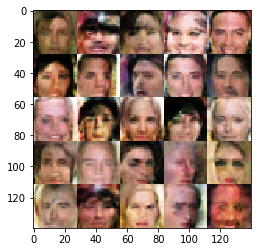

Epoch 1/1... Discriminator Loss: 0.5489... Generator Loss: 3.5283
Epoch 1/1... Discriminator Loss: 0.9957... Generator Loss: 3.4237
Epoch 1/1... Discriminator Loss: 1.9597... Generator Loss: 1.1163
Epoch 1/1... Discriminator Loss: 0.6410... Generator Loss: 1.8863
Epoch 1/1... Discriminator Loss: 0.5766... Generator Loss: 3.1459
Epoch 1/1... Discriminator Loss: 0.6177... Generator Loss: 1.7711
Epoch 1/1... Discriminator Loss: 0.6777... Generator Loss: 2.2985
Epoch 1/1... Discriminator Loss: 0.5468... Generator Loss: 2.3980
Epoch 1/1... Discriminator Loss: 0.4963... Generator Loss: 1.7627
Epoch 1/1... Discriminator Loss: 1.0347... Generator Loss: 1.2828


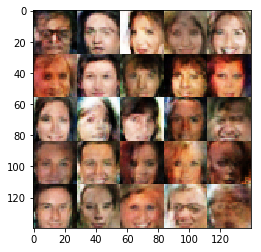

Epoch 1/1... Discriminator Loss: 1.0945... Generator Loss: 0.9045
Epoch 1/1... Discriminator Loss: 0.4914... Generator Loss: 3.4298
Epoch 1/1... Discriminator Loss: 0.7147... Generator Loss: 2.3748
Epoch 1/1... Discriminator Loss: 0.6414... Generator Loss: 2.0567
Epoch 1/1... Discriminator Loss: 0.5126... Generator Loss: 2.2252
Epoch 1/1... Discriminator Loss: 0.7412... Generator Loss: 1.3554
Epoch 1/1... Discriminator Loss: 0.9176... Generator Loss: 1.7809
Epoch 1/1... Discriminator Loss: 0.5703... Generator Loss: 2.1341
Epoch 1/1... Discriminator Loss: 0.6846... Generator Loss: 2.8895
Epoch 1/1... Discriminator Loss: 0.4541... Generator Loss: 1.9361


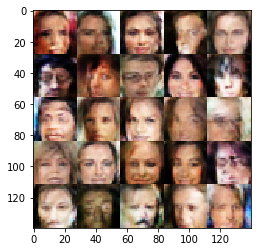

Epoch 1/1... Discriminator Loss: 0.4711... Generator Loss: 0.7819
Epoch 1/1... Discriminator Loss: 0.8937... Generator Loss: 2.1080
Epoch 1/1... Discriminator Loss: 0.7148... Generator Loss: 1.6329
Epoch 1/1... Discriminator Loss: 0.5926... Generator Loss: 1.4823
Epoch 1/1... Discriminator Loss: 0.4740... Generator Loss: 1.7720
Epoch 1/1... Discriminator Loss: 0.6671... Generator Loss: 1.4472
Epoch 1/1... Discriminator Loss: 0.7189... Generator Loss: 1.3319
Epoch 1/1... Discriminator Loss: 0.4689... Generator Loss: 1.6731
Epoch 1/1... Discriminator Loss: 0.4886... Generator Loss: 2.6779
Epoch 1/1... Discriminator Loss: 0.4739... Generator Loss: 3.2059


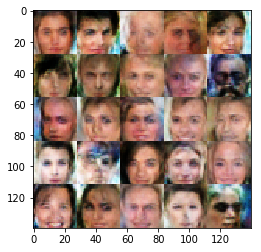

Epoch 1/1... Discriminator Loss: 0.8083... Generator Loss: 1.7588
Epoch 1/1... Discriminator Loss: 0.6065... Generator Loss: 3.1250
Epoch 1/1... Discriminator Loss: 0.6117... Generator Loss: 2.1033
Epoch 1/1... Discriminator Loss: 0.9972... Generator Loss: 0.9687
Epoch 1/1... Discriminator Loss: 0.5607... Generator Loss: 2.1519
Epoch 1/1... Discriminator Loss: 0.9325... Generator Loss: 0.8060
Epoch 1/1... Discriminator Loss: 0.5861... Generator Loss: 2.1073
Epoch 1/1... Discriminator Loss: 0.7064... Generator Loss: 2.3588
Epoch 1/1... Discriminator Loss: 0.5200... Generator Loss: 2.9003
Epoch 1/1... Discriminator Loss: 0.4831... Generator Loss: 2.3563


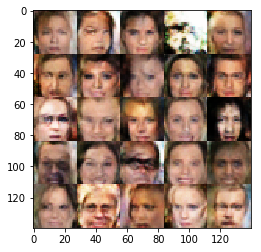

Epoch 1/1... Discriminator Loss: 0.5192... Generator Loss: 1.7513
Epoch 1/1... Discriminator Loss: 0.7216... Generator Loss: 1.6748
Epoch 1/1... Discriminator Loss: 0.6050... Generator Loss: 1.5633
Epoch 1/1... Discriminator Loss: 0.7746... Generator Loss: 1.0618
Epoch 1/1... Discriminator Loss: 0.5373... Generator Loss: 3.0821
Epoch 1/1... Discriminator Loss: 0.6310... Generator Loss: 3.4713
Epoch 1/1... Discriminator Loss: 0.6325... Generator Loss: 1.5971
Epoch 1/1... Discriminator Loss: 0.4891... Generator Loss: 1.5020
Epoch 1/1... Discriminator Loss: 0.9482... Generator Loss: 0.6231
Epoch 1/1... Discriminator Loss: 0.6492... Generator Loss: 2.3054


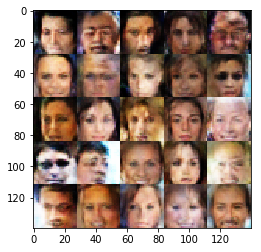

Epoch 1/1... Discriminator Loss: 0.7116... Generator Loss: 1.7545
Epoch 1/1... Discriminator Loss: 0.7593... Generator Loss: 0.7828
Epoch 1/1... Discriminator Loss: 0.4850... Generator Loss: 0.9434
Epoch 1/1... Discriminator Loss: 0.4807... Generator Loss: 2.1904
Epoch 1/1... Discriminator Loss: 0.6810... Generator Loss: 1.7290
Epoch 1/1... Discriminator Loss: 0.6327... Generator Loss: 2.1469
Epoch 1/1... Discriminator Loss: 1.0982... Generator Loss: 3.7353
Epoch 1/1... Discriminator Loss: 2.2690... Generator Loss: 0.7743
Epoch 1/1... Discriminator Loss: 1.4910... Generator Loss: 1.1635
Epoch 1/1... Discriminator Loss: 0.5717... Generator Loss: 1.7680


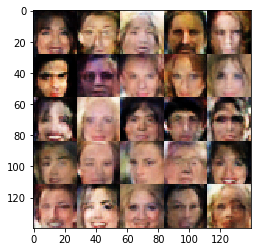

Epoch 1/1... Discriminator Loss: 0.7916... Generator Loss: 1.0097
Epoch 1/1... Discriminator Loss: 0.6015... Generator Loss: 1.7921
Epoch 1/1... Discriminator Loss: 0.4628... Generator Loss: 2.8747
Epoch 1/1... Discriminator Loss: 0.5072... Generator Loss: 1.3205
Epoch 1/1... Discriminator Loss: 0.4990... Generator Loss: 2.8834
Epoch 1/1... Discriminator Loss: 0.5997... Generator Loss: 1.5126
Epoch 1/1... Discriminator Loss: 0.4063... Generator Loss: 1.6830
Epoch 1/1... Discriminator Loss: 0.5227... Generator Loss: 0.6119
Epoch 1/1... Discriminator Loss: 0.7888... Generator Loss: 0.8633
Epoch 1/1... Discriminator Loss: 1.0093... Generator Loss: 0.5824


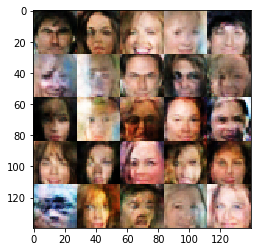

Epoch 1/1... Discriminator Loss: 0.5714... Generator Loss: 1.5418
Epoch 1/1... Discriminator Loss: 0.6555... Generator Loss: 3.2644
Epoch 1/1... Discriminator Loss: 0.4136... Generator Loss: 2.0972
Epoch 1/1... Discriminator Loss: 0.6775... Generator Loss: 2.0495
Epoch 1/1... Discriminator Loss: 1.0322... Generator Loss: 1.8810
Epoch 1/1... Discriminator Loss: 0.6321... Generator Loss: 1.6205
Epoch 1/1... Discriminator Loss: 0.5610... Generator Loss: 1.6013
Epoch 1/1... Discriminator Loss: 0.5342... Generator Loss: 1.6798
Epoch 1/1... Discriminator Loss: 0.7230... Generator Loss: 0.9245
Epoch 1/1... Discriminator Loss: 0.7068... Generator Loss: 2.8469


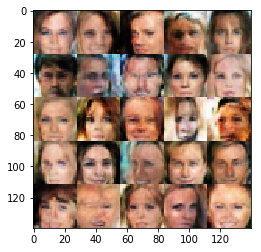

Epoch 1/1... Discriminator Loss: 0.5796... Generator Loss: 2.2458
Epoch 1/1... Discriminator Loss: 0.5519... Generator Loss: 2.1011
Epoch 1/1... Discriminator Loss: 0.5269... Generator Loss: 1.1576
Epoch 1/1... Discriminator Loss: 0.5425... Generator Loss: 1.0583
Epoch 1/1... Discriminator Loss: 0.6988... Generator Loss: 4.0610
Epoch 1/1... Discriminator Loss: 0.3977... Generator Loss: 2.0745
Epoch 1/1... Discriminator Loss: 0.6997... Generator Loss: 2.0816
Epoch 1/1... Discriminator Loss: 0.5604... Generator Loss: 2.1607
Epoch 1/1... Discriminator Loss: 0.8042... Generator Loss: 1.4192
Epoch 1/1... Discriminator Loss: 0.6089... Generator Loss: 2.4071


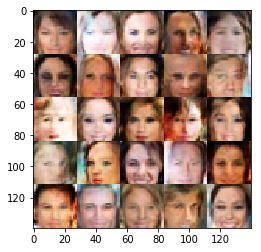

Epoch 1/1... Discriminator Loss: 0.5436... Generator Loss: 2.2507
Epoch 1/1... Discriminator Loss: 0.8646... Generator Loss: 0.7297
Epoch 1/1... Discriminator Loss: 1.5627... Generator Loss: 0.7289
Epoch 1/1... Discriminator Loss: 0.6304... Generator Loss: 2.4172
Epoch 1/1... Discriminator Loss: 0.4790... Generator Loss: 2.2998
Epoch 1/1... Discriminator Loss: 0.6096... Generator Loss: 4.5531
Epoch 1/1... Discriminator Loss: 0.5194... Generator Loss: 2.0313
Epoch 1/1... Discriminator Loss: 0.7705... Generator Loss: 1.3772
Epoch 1/1... Discriminator Loss: 0.6131... Generator Loss: 1.1621
Epoch 1/1... Discriminator Loss: 0.5258... Generator Loss: 1.3807


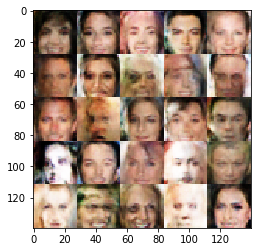

Epoch 1/1... Discriminator Loss: 0.5536... Generator Loss: 2.4512
Epoch 1/1... Discriminator Loss: 0.6530... Generator Loss: 2.1509
Epoch 1/1... Discriminator Loss: 0.6564... Generator Loss: 1.5900
Epoch 1/1... Discriminator Loss: 0.9673... Generator Loss: 1.6646
Epoch 1/1... Discriminator Loss: 0.8711... Generator Loss: 1.2017
Epoch 1/1... Discriminator Loss: 0.6830... Generator Loss: 2.3366
Epoch 1/1... Discriminator Loss: 0.6662... Generator Loss: 2.2393
Epoch 1/1... Discriminator Loss: 1.6703... Generator Loss: 0.6752
Epoch 1/1... Discriminator Loss: 0.6337... Generator Loss: 1.9828
Epoch 1/1... Discriminator Loss: 0.5192... Generator Loss: 2.0498


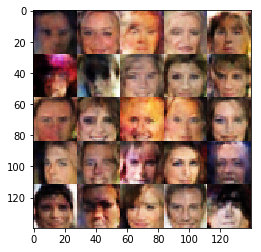

Epoch 1/1... Discriminator Loss: 0.6411... Generator Loss: 1.5370
Epoch 1/1... Discriminator Loss: 0.6081... Generator Loss: 1.4851
Epoch 1/1... Discriminator Loss: 0.6246... Generator Loss: 1.9265
Epoch 1/1... Discriminator Loss: 0.4918... Generator Loss: 2.1771
Epoch 1/1... Discriminator Loss: 0.7052... Generator Loss: 0.9659
Epoch 1/1... Discriminator Loss: 0.7686... Generator Loss: 0.7698
Epoch 1/1... Discriminator Loss: 0.6772... Generator Loss: 1.5640
Epoch 1/1... Discriminator Loss: 0.5572... Generator Loss: 1.6374
Epoch 1/1... Discriminator Loss: 0.5563... Generator Loss: 1.8487
Epoch 1/1... Discriminator Loss: 0.6527... Generator Loss: 2.7954


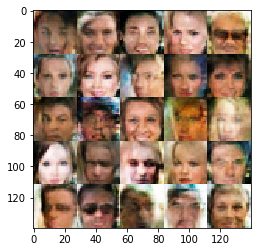

Epoch 1/1... Discriminator Loss: 0.4934... Generator Loss: 2.0091
Epoch 1/1... Discriminator Loss: 0.6919... Generator Loss: 2.7370
Epoch 1/1... Discriminator Loss: 0.6476... Generator Loss: 1.0666
Epoch 1/1... Discriminator Loss: 0.4266... Generator Loss: 2.3052
Epoch 1/1... Discriminator Loss: 0.7483... Generator Loss: 1.7856
Epoch 1/1... Discriminator Loss: 0.6510... Generator Loss: 1.8509
Epoch 1/1... Discriminator Loss: 0.4920... Generator Loss: 3.0091
Epoch 1/1... Discriminator Loss: 0.7788... Generator Loss: 2.1471
Epoch 1/1... Discriminator Loss: 0.5174... Generator Loss: 2.6038
Epoch 1/1... Discriminator Loss: 0.5566... Generator Loss: 2.6019


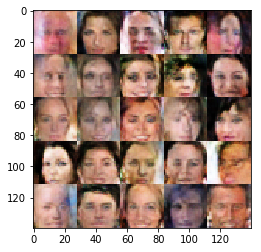

Epoch 1/1... Discriminator Loss: 0.5294... Generator Loss: 3.1181
Epoch 1/1... Discriminator Loss: 0.6089... Generator Loss: 4.0595
Epoch 1/1... Discriminator Loss: 0.4285... Generator Loss: 3.8157
Epoch 1/1... Discriminator Loss: 1.1944... Generator Loss: 0.8595
Epoch 1/1... Discriminator Loss: 0.6815... Generator Loss: 2.2734
Epoch 1/1... Discriminator Loss: 0.6681... Generator Loss: 1.7875
Epoch 1/1... Discriminator Loss: 0.6557... Generator Loss: 2.5686
Epoch 1/1... Discriminator Loss: 0.8868... Generator Loss: 3.1987
Epoch 1/1... Discriminator Loss: 0.4367... Generator Loss: 2.1286
Epoch 1/1... Discriminator Loss: 1.1500... Generator Loss: 3.5782


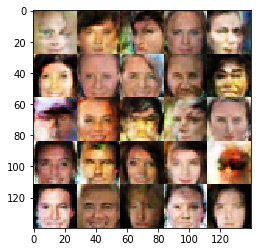

Epoch 1/1... Discriminator Loss: 0.5268... Generator Loss: 2.7963
Epoch 1/1... Discriminator Loss: 0.4126... Generator Loss: 3.7573
Epoch 1/1... Discriminator Loss: 1.1408... Generator Loss: 2.5740
Epoch 1/1... Discriminator Loss: 1.1579... Generator Loss: 1.4091
Epoch 1/1... Discriminator Loss: 0.4661... Generator Loss: 2.6697
Epoch 1/1... Discriminator Loss: 0.7484... Generator Loss: 2.0344


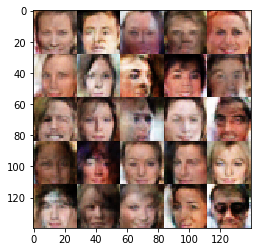

In [13]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.